<a href="https://colab.research.google.com/github/evalukac/PPPO-EvaLukac-IT2-2019-Klasifikacija/blob/main/EvaLukacIT2_2019_PPPO_LEGO_klasifikacija.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Klasifikacija**

Klasifikacija predstavlja postupak određivanja tj. predviđanja, pri čemu se za ulazni set podataka, odnosno za svaki ulazni podatak određuje klasa kojoj taj ulazni podatak pripada na osnovu njegovih karakteristika.

Klasifikacija uključuje izgradnju modela na osnovu trening skupa podataka koji sadrže objekte sa poznatim klasama. Model se zatim koristi za predviđanje klasa novih, neviđenih objekata na osnovu njihovih karakteristika.

 Postoje nadgledano i nenadgledano mašinsko učenje, pri čemu se klasifikacija ubraja u kategoriju nadgledanog mašinskog učenja. Npr. prepoznavanje da li se novinski članak tiče ekonomije, sporta ili politike je takođe problem klasifikacije. U okviru mašinskog učenja, konkretno za uspešnost zadatka klasifikacije važno je da set ulaznih podataka bude dovoljno obiman, kao i da podaci unutar seta podataka budu raznovrsni kako bi se dobio dobro istreniran model.

Cilj izrade ovog rada je da se za slike lego figurica predvidi kojoj klasi one pripadaju. Primenom Transfer Learning-a, odnosno korišćenjem već unapred istreniranih neuronskih mreža na koje se dodaje poslednji sloj koji sadrži onoliko neurona koliko postoji klasa figurica, u ovom slučaju 37.

Za potrebe ovog projekta korištene su tri konvolucijske neuronske mreže: DenseNet121, ResNet50 i MobileNetV2.


## **Biblioteke**

Prvi korak je učitavanje potrebnih biblioteka za ovaj projekat.

Za potrebu ovog projekta, sve operacije i grafičke prikaze, potrebno je uvesti nekoliko Python biblioteka. To su:

*   numpy - omogućava rad sa nizovima,
*   pandas - koristi se za analizu podataka,
*   seaborn - upotreba vizualizacija,
*   cv2 - import Python modula.

TensorFlow je besplatna biblioteka otvorenog koda za mašinsko učenje i veštačku inteligenciju. Može se koristiti u nizu zadataka, ali ima poseban fokus na obuci i zaključivanju dubokih neuronskih mreža.

Potrebno je importovati i nekoliko biblioteka specificiranih za mašinsko učenje i neuronske mreže, kao i date grafičke alate reprezentacije da bi se rezultati operacija prikazali na analitički način.

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import cv2

import tensorflow as tf
from tensorflow.keras.applications import mobilenet_v2 as tf_mobilenet_v2
from tensorflow.keras import layers,models
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Flatten,Dropout, Dense
from tensorflow.keras.optimizers import Adam

from tensorflow.keras.preprocessing.image import  load_img,img_to_array

from sklearn.model_selection import train_test_split

import matplotlib.pyplot as plt
import matplotlib.image as mpimg

## **Učitavanje seta podataka**

Sledeći korak u radu je učitavanje podataka sa Google Drive linka. Izvorni podaci su smešteni u 5 foldera koji u sebi sadrže podfoldere. Glavni folderi su navedeni pod nazivima:

*   harry-potter
*   jurrasic-world
*   marvel
*   star-wars
*   test

Pored ovih foldera koji sadrže slike, postoje csv fajlovi koji pored podataka za svaku sliku određuju koje slike služe za trening a koje za testiranje nakon treniranja modela.To su: index.csv, metadata.csv i test.csv.

Kada se podaci učitavaju na prikazani način, dobijaju nasumičan naziv, koji bi trebalo promeniti radi lakšeg daljeg rada.

In [ ]:
!wget --load-cookies /tmp/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies /tmp/cookies.txt --keep-session-cookies --no-check-certificate 'https://drive.google.com/file/d/1RxKmPkhzCZFK-w7s3KC5ljsHOOu53VMk/view?usp=sharing' -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id=1RxKmPkhzCZFK-w7s3KC5ljsHOOu53VMk"


--2023-08-20 13:06:49--  https://docs.google.com/uc?export=download&confirm=&id=1RxKmPkhzCZFK-w7s3KC5ljsHOOu53VMk
Resolving docs.google.com (docs.google.com)... 74.125.130.113, 74.125.130.138, 74.125.130.139, ...
Connecting to docs.google.com (docs.google.com)|74.125.130.113|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://doc-14-2g-docs.googleusercontent.com/docs/securesc/in7sp5ujv88op17a1aegu8q6i7cpvs0d/n1spgdhch2e6g3g7deef09uem6qg8c8u/1692536775000/12172178362461080244/12412142132452310730Z/1RxKmPkhzCZFK-w7s3KC5ljsHOOu53VMk?e=download&uuid=d29ed8d5-590d-4a14-9c9a-bb779acf923b [following]
--2023-08-20 13:06:49--  https://doc-14-2g-docs.googleusercontent.com/docs/securesc/in7sp5ujv88op17a1aegu8q6i7cpvs0d/n1spgdhch2e6g3g7deef09uem6qg8c8u/1692536775000/12172178362461080244/12412142132452310730Z/1RxKmPkhzCZFK-w7s3KC5ljsHOOu53VMk?e=download&uuid=d29ed8d5-590d-4a14-9c9a-bb779acf923b
Resolving doc-14-2g-docs.googleusercontent.com (doc-14-2g-docs.goo

Ćelija ispod služi za stavljanje podataka sa Google Drive-a u zip fajl sa nazivom data.zip.

In [ ]:
!pip install gdown
import gdown

url = 'https://docs.google.com/uc?export=download&confirm=&id=1RxKmPkhzCZFK-w7s3KC5ljsHOOu53VMk'
output = 'data.zip'
gdown.download(url, output, quiet=False)

Downloading...
From: https://docs.google.com/uc?export=download&confirm=&id=1RxKmPkhzCZFK-w7s3KC5ljsHOOu53VMk
To: /content/data.zip
100%|██████████| 30.2M/30.2M [00:00<00:00, 143MB/s] 


'data.zip'

Zip fajl od malopre pod nazivom data.zip se sada raspakuje.

In [ ]:
!unzip data.zip

Archive:  data.zip
  inflating: LICENSE                 
  inflating: harry-potter/0001/001.jpg  
  inflating: harry-potter/0001/002.jpg  
  inflating: harry-potter/0001/003.jpg  
  inflating: harry-potter/0001/004.jpg  
  inflating: harry-potter/0001/005.jpg  
  inflating: harry-potter/0001/006.jpg  
  inflating: harry-potter/0001/007.jpg  
  inflating: harry-potter/0001/008.jpg  
  inflating: harry-potter/0001/009.jpg  
  inflating: harry-potter/0001/010.jpg  
  inflating: harry-potter/0001/011.jpg  
  inflating: harry-potter/0001/012.jpg  
  inflating: harry-potter/0001/013.jpg  
  inflating: harry-potter/0002/001.jpg  
  inflating: harry-potter/0002/002.jpg  
  inflating: harry-potter/0002/003.jpg  
  inflating: harry-potter/0002/004.jpg  
  inflating: harry-potter/0002/005.jpg  
  inflating: harry-potter/0002/006.jpg  
  inflating: harry-potter/0002/007.jpg  
  inflating: harry-potter/0002/008.jpg  
  inflating: harry-potter/0002/009.jpg  
  inflating: harry-potter/0002/010.jpg  


## **Analiza seta podataka**

U narednih nekoliko ćelija izvršena je neka osnovna analiza podataka, da bi se dobio uvid u to sa čime se tačno raspolaže u okviru seta podataka.

Prvo, učitava se i koristi grafički prikaz fotografija iz seta podataka.

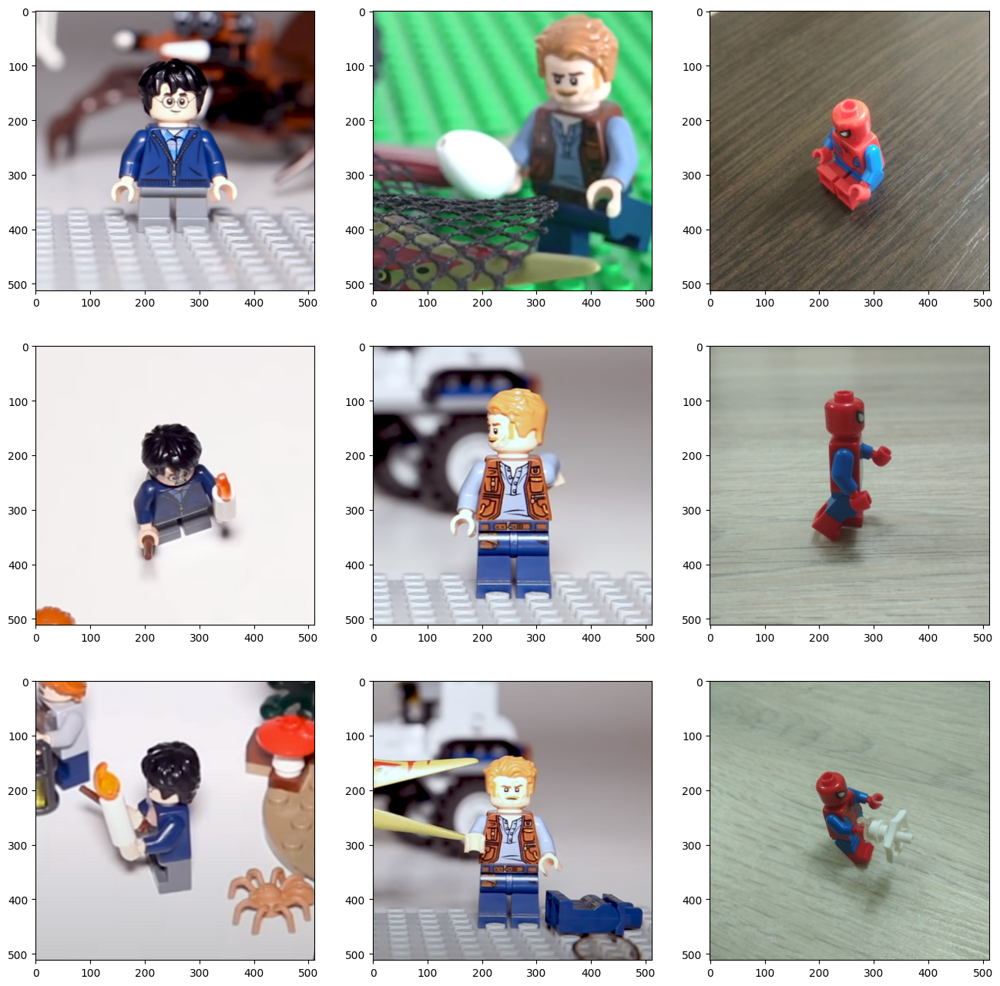

In [ ]:
images = [[],[],[]]
index = ['002', '005', '007']

for i in range(3):
    images[i].append(mpimg.imread('harry-potter/0001/' + index[i] + '.jpg'))
    images[i].append(mpimg.imread('jurassic-world/0001/' + index[i] + '.jpg'))
    images[i].append(mpimg.imread('marvel/0001/' + index[i] + '.jpg'))

fig, axs = plt.subplots(3,3, figsize=(16,16))

for i in range(3):
    for j in range(3):
        axs[i, j].imshow(images[i][j])

Učitavamo jednu od slika iz seta podataka. Pretvaramo učitanu sliku u NumPy niz. NumPy je popularna biblioteka za rad s numeričkim podacima u Pythonu. Tako da ovde pretvaramo sliku u trodimenzionalni NumPy niz, gde prve dve dimenzije predstavljaju visinu i širinu slike, dok treća dimenzija predstavlja kanale boje (obično 3 za RGB sliku). Nakon toga ispisujemo i dimenzije niza. U ovom slučaju, *shape* niza će biti (visina, širina, kanali boje). Zaključujemo ovim da su slike iz seta podataka dimenzija 512x512 i da su u boji.

In [ ]:
image = load_img("harry-potter/0001/003.jpg")
x=img_to_array(image)
print(x.shape)

(512, 512, 3)


Dalje, učitavaju se podaci iz CSV fajla *index.csv* i smeštaju se u DataFrame, što omogućava dalju manipulaciju i analizu podataka koristeći pandas biblioteku.
Pandas je biblioteka koja se često koristi za manipulaciju podacima u Pythonu.

In [ ]:
index_df = pd.read_csv('index.csv')
index_df

,path,class_id
0,marvel/0001/001.jpg,1
1,marvel/0001/002.jpg,1
2,marvel/0001/003.jpg,1
3,marvel/0001/004.jpg,1
4,marvel/0001/005.jpg,1
...,...,...
366,star-wars/0017/006.jpg,38
367,star-wars/0017/007.jpg,38
368,star-wars/0017/008.jpg,38
369,star-wars/0017/009.jpg,38


Sada se učitavaju metapodaci iz CSV fajla, računa se broj klasa i ti podaci se smeštaju u DataFrame, čime se omogućava dalje rukovanje i analiza ovih podataka koristeći pandas biblioteku.

In [ ]:
metadata_df = pd.read_csv('metadata.csv', encoding='latin-1')
n_classes = metadata_df.shape[0]
metadata_df

,class_id,lego_ids,lego_names,minifigure_name
0,1,[76115],['Spider Mech vs. Venom'],SPIDER-MAN
1,2,[76115],['Spider Mech vs. Venom'],VENOM
2,3,[76115],['Spider Mech vs. Venom'],AUNT MAY
3,4,[76115],['Spider Mech vs. Venom'],GHOST SPIDER
4,5,[75208],"[""Yoda's Hut""]",YODA
5,6,[75208],"[""Yoda's Hut""]",LUKE SKYWALKER
6,7,[75208],"[""Yoda's Hut""]",R2-D2
7,8,[75199],"[""General Grievous' Combat Speeder""]",MACE WINDU
8,9,[75199],"[""General Grievous' Combat Speeder""]",GENERAL GRIEVOUS
9,10,[75264],"[""Kylo Ren's Shuttle Microfighter""]",KYLO REN


Spajaju se dva DataFramea na osnovu zajedničke kolone 'class_id', čime se kreira novi DataFrame koji sadrži kombinaciju odabranih podataka iz oba izvorna DataFramea. Novi DataFrame sadrži kolone: 'path', 'class_id' i 'minifigure_name'.

In [ ]:
data_df = pd.merge(index_df, metadata_df[['class_id', 'minifigure_name']], on='class_id')
data_df

,path,class_id,minifigure_name
0,marvel/0001/001.jpg,1,SPIDER-MAN
1,marvel/0001/002.jpg,1,SPIDER-MAN
2,marvel/0001/003.jpg,1,SPIDER-MAN
3,marvel/0001/004.jpg,1,SPIDER-MAN
4,marvel/0001/005.jpg,1,SPIDER-MAN
...,...,...,...
366,star-wars/0017/006.jpg,38,BOBA FETT
367,star-wars/0017/007.jpg,38,BOBA FETT
368,star-wars/0017/008.jpg,38,BOBA FETT
369,star-wars/0017/009.jpg,38,BOBA FETT


Pozivanjem info() metode dobija se sažetak informacija o strukturi i sadržaju DataFramea data_df. Ova metoda pruža sledeće informacije:

1.  Broj redova (instanci) u DataFrame-u.
2.  Broj kolona u DataFrame-u.
3.  Nazivi kolona i njihovi tipovi podataka.
4.  Broj nepopunjenih (null) vrednosti za svaku kolonu.
5.  Ukupnu upotrebu memorije od strane DataFrame-a.

In [ ]:
data_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 371 entries, 0 to 370
Data columns (total 3 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   path             371 non-null    object
 1   class_id         371 non-null    int64 
 2   minifigure_name  371 non-null    object
dtypes: int64(1), object(2)
memory usage: 11.6+ KB


Sada se vrši vizualizacija uzorka slika i njihovih imena povezanih s minifigurama. Svaka slika se prikazuje unutar svog subplota zajedno sa odgovarajućim imenom. Sve to se prikazuje u jednoj velikoj slici.

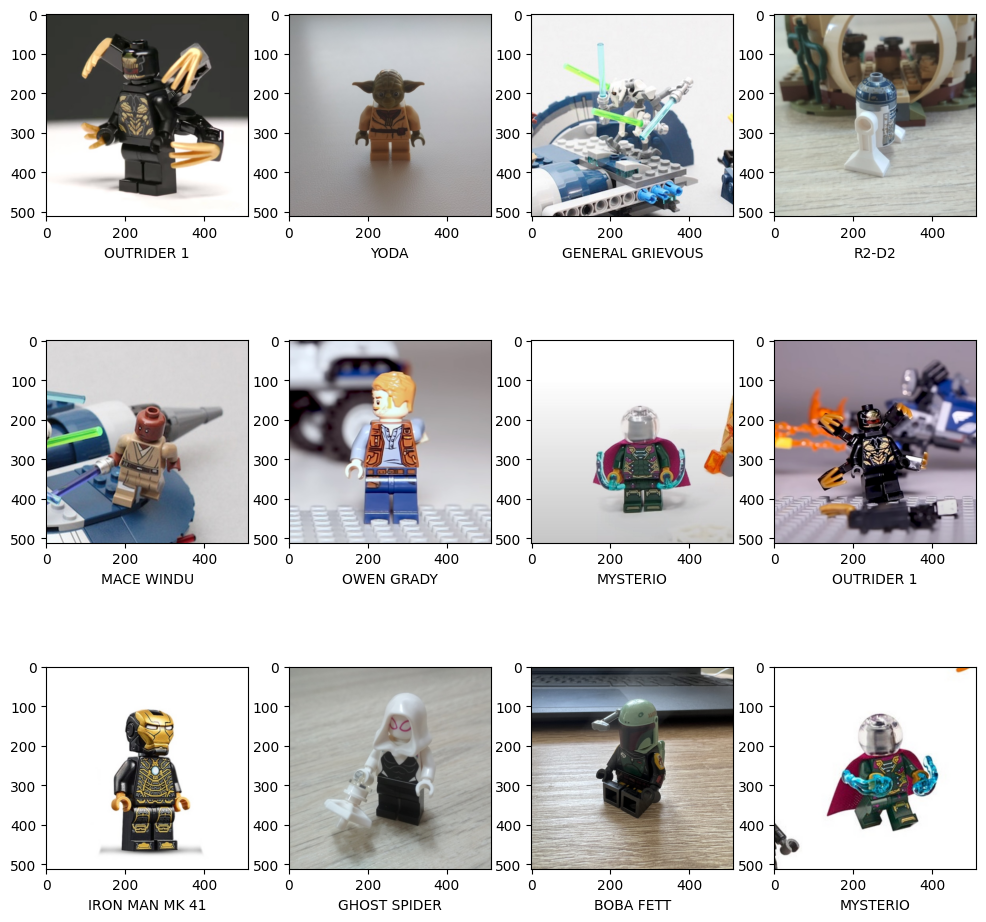

In [ ]:
sample_df = data_df.sample(20)
plt.figure(figsize=(12, 12))
for i in range(12):
    plt.subplot(3, 4, i + 1)
    plt.grid(False)
    img = Image.open(sample_df['path'].values[i])
    plt.imshow(img)
    plt.xlabel(sample_df['minifigure_name'].values[i])

plt.show()

Ovaj kod koristi biblioteku Plotly za vizualizaciju broja pojavljivanja svake minifigure u obliku grafikona. Boja traka zavisi od broja pojavljivanja, a pored svake trake se prikazuje i brojčana vrednost.

In [ ]:
import plotly.graph_objects as go
df_count=data_df['minifigure_name'].value_counts().to_frame().reset_index().rename(columns={'index':'minifigure_name','minifigure_name':'Count'})

fig = go.Figure(go.Bar(
    x=df_count['minifigure_name'],y=df_count['Count'],
    marker={'color': df_count['Count'],
    'colorscale': 'ylgnbu'},
    text=df_count['Count'],
    textposition = "outside",
))
fig.update_layout(title_text='Number of every minifigure',xaxis_title="Minifigure Name",yaxis_title="Count",title_x=0.5)
fig.show()

 Vrši se priprema testnih podataka. Učitani su testni podaci iz CSV fajla i izbačena je kolona "class_id", tako da DataFrame X_test sadrži sve ostale informacije potrebne za testiranje modela i dalju analizu.

In [ ]:
test_df = pd.read_csv('test.csv')
X_test = test_df.drop(columns = ['class_id'])
X_test

,path
0,test/001.jpg
1,test/002.jpg
2,test/003.jpg
3,test/004.jpg
4,test/005.jpg
...,...
74,test/075.jpg
75,test/076.jpg
76,test/077.jpg
77,test/078.jpg


Kreira se DataFrame y_test koji sadrži ciljne vrednosti tj. oznake klasa za testni skup podataka. Ciljne vrednosti neophodne su za evaluaciju performansi modela ili analizu rezultata.

In [ ]:
y_test = test_df['class_id']
y_test

0     32
1     32
2     32
3     32
4      1
      ..
74    37
75    37
76    38
77    38
78    38
Name: class_id, Length: 79, dtype: int64

Koristi se funkcija merge kako bi se spojio testni DataFrame test_df sa DataFrameom koji sadrži metapodatke metadata_df. Spajanje se vrši prema koloni 'class_id'. Ovime se dodaju informacije kao što su ime minifigure i druge metapodatke za svaki testni uzorak. DataFrame test_actual_df se sortira po koloni 'path'. Ovo se radi kako bi se podaci rasporedili u određenom redosledu, u ovom slučaju, po putanjama do slika.  Ovaj DataFrame sadrži proširene informacije o testnim uzorcima.

In [ ]:
test_actual_df = pd.merge(test_df, metadata_df[['class_id', 'minifigure_name']], on='class_id')
test_actual_df = test_actual_df.sort_values('path')
test_actual_df

,path,class_id,minifigure_name
0,test/001.jpg,32,JANNAH
1,test/002.jpg,32,JANNAH
2,test/003.jpg,32,JANNAH
3,test/004.jpg,32,JANNAH
4,test/005.jpg,1,SPIDER-MAN
...,...,...,...
74,test/075.jpg,37,OBI-WAN KENOBI
75,test/076.jpg,37,OBI-WAN KENOBI
76,test/077.jpg,38,BOBA FETT
77,test/078.jpg,38,BOBA FETT


Kreira se X_data koje sadrži sve podatke iz data_df, ali bez kolone 'class_id'. Na ovaj način se pripremaju ulazni podaci za treniranje modela i izdvajaju se sve karakteristike osim ciljnih vrednosti.

In [ ]:
X_data = data_df.drop(columns = ['class_id'])
X_data

,path,minifigure_name
0,marvel/0001/001.jpg,SPIDER-MAN
1,marvel/0001/002.jpg,SPIDER-MAN
2,marvel/0001/003.jpg,SPIDER-MAN
3,marvel/0001/004.jpg,SPIDER-MAN
4,marvel/0001/005.jpg,SPIDER-MAN
...,...,...
366,star-wars/0017/006.jpg,BOBA FETT
367,star-wars/0017/007.jpg,BOBA FETT
368,star-wars/0017/008.jpg,BOBA FETT
369,star-wars/0017/009.jpg,BOBA FETT


Kreira se DataFrame y_data koji sadrži ciljne vrednosti za trening skupa podataka.

In [ ]:
y_data = data_df['class_id']
y_data

0       1
1       1
2       1
3       1
4       1
       ..
366    38
367    38
368    38
369    38
370    38
Name: class_id, Length: 371, dtype: int64

Proverava se broj redova u DataFrameu data_df, odnosno ukupan broj uzoraka u skupu podataka koji se nalazi u tom DataFrameu. Ovaj izraz se koristi za određivanje obima podataka.

In [ ]:
len(data_df)

371

Na isti način vrši se određivanje obima testnih podataka, tj. koliko uzoraka se nalazi u testnom skupu podataka.

In [ ]:
len(test_df)

79

Koristi se funkcija **train_test_split** iz biblioteke Scikit-learn kako bi se trening podaci podelili na trening i validacioni skup.

Ulazni podatci X_data i ciljne vrednosti y_data dele se na trening i validacioni skup.

**test_size=0.20** označava da će se 20% podataka koristiti za validaciju skupa, dok će preostalih 80% biti za trening.

**random_state=8** postavlja seed vrednost za generisanje nasumičnosti prilikom deljenja. Ovo osigurava da se podela podataka može reprodukovati ako je ista seed vrednost korišćena.

*  **X_train** sadrži trening podatke za ulazne karakteristike.
*  **X_val** sadrži validacione podatke za ulazne karakteristike.
*  **y_train** sadrži ciljne vrednosti za trening skup.
*  **y_val** sadrži ciljne vrednosti za validacioni skup.

Ovaj korak je važan prilikom treniranja modela jer omogućava da se trenira model na trening skupu i evaluira na validacionom skupu kako bi se pratila njegova performansa i izbegao overfitting.

In [ ]:
X_train, X_val, y_train, y_val = train_test_split(X_data, y_data,
    test_size=0.20, random_state= 8)

 Vrši se pretvaranje i pripremu trening podataka i ciljnih vrednosti kako bi se mogli koristiti za treniranje modela.

 Inicijalizuje se prazan NumPy niz X_train_converted gde će se čuvati konvertovane slike. Slike se skaliraju na dimenzije 224x224 piksela. Ovo se radi kako bi se osiguralo da sve slike budu iste dimenzije.

 Boje slike se konvertuju iz BGR u RGB pomoću funkcije cvtColor. Većina biblioteka za duboko učenje i obradu slika koristi RGB format.

 Konvertovana slika se smešta u odgovarajući red NumPy niza X_train_converted, a pikseli se skaliraju na opseg od 0 do 1 deljenjem sa 255. To je standardna praksa kod obrade slika da bi se normalizovali pikseli.

 Ciljne vrednosti se konvertuju u NumPy niz i smanjuju za 1.

In [ ]:
X_train_converted = np.zeros((X_train.shape[0], 224, 224, 3))

for i in range(X_train.shape[0]):
    image = cv2.imread(X_train["path"].values[i])
    image = cv2.resize(image, dsize=(224,224)) # resize in case if image was not 224x224 pixels
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    X_train_converted[i] = image/255

y_train_converted = np.array(y_train)-1

In [ ]:
X_train_converted[0]

array([[[0.69803922, 0.68627451, 0.66666667],
        [0.69411765, 0.68235294, 0.6627451 ],
        [0.69411765, 0.68235294, 0.65490196],
        ...,
        [0.59215686, 0.54509804, 0.49019608],
        [0.59607843, 0.54901961, 0.49411765],
        [0.59215686, 0.54509804, 0.49019608]],

       [[0.68627451, 0.6745098 , 0.65490196],
        [0.68627451, 0.6745098 , 0.64705882],
        [0.68235294, 0.67058824, 0.64313725],
        ...,
        [0.60392157, 0.55686275, 0.50196078],
        [0.60392157, 0.55686275, 0.50196078],
        [0.59607843, 0.54901961, 0.49411765]],

       [[0.67843137, 0.6627451 , 0.63921569],
        [0.67843137, 0.6627451 , 0.63921569],
        [0.6745098 , 0.65490196, 0.63137255],
        ...,
        [0.6       , 0.55294118, 0.49803922],
        [0.60392157, 0.55686275, 0.50196078],
        [0.6       , 0.55294118, 0.49803922]],

       ...,

       [[0.58431373, 0.55686275, 0.52156863],
        [0.66666667, 0.63529412, 0.61176471],
        [0.63529412, 0

Veoma slično prethodnom kodu koji je korišćen za konverziju i pripremu trening podataka. Ovde se radi ista operacija, ali za validacioni skup podataka.

In [ ]:
X_val_converted = np.zeros((X_val.shape[0], 224, 224, 3))

for i in range(X_val.shape[0]):
    image = cv2.imread(X_val["path"].values[i])
    image = cv2.resize(image, dsize=(224,224)) # resize in case if image was not 224x224 pixels
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    X_val_converted[i] = image/255

y_val_converted = np.array(y_val)-1

In [ ]:
X_val_converted[0]

array([[[0.37254902, 0.34117647, 0.2745098 ],
        [0.38823529, 0.34901961, 0.28235294],
        [0.38431373, 0.34901961, 0.28235294],
        ...,
        [0.56078431, 0.54901961, 0.48235294],
        [0.56470588, 0.54901961, 0.48235294],
        [0.55686275, 0.54509804, 0.47843137]],

       [[0.39215686, 0.36470588, 0.29411765],
        [0.41176471, 0.38431373, 0.31372549],
        [0.41176471, 0.37647059, 0.30980392],
        ...,
        [0.56470588, 0.55294118, 0.48627451],
        [0.57254902, 0.56078431, 0.49411765],
        [0.56862745, 0.55686275, 0.49019608]],

       [[0.41960784, 0.39215686, 0.32156863],
        [0.41176471, 0.38431373, 0.31372549],
        [0.40392157, 0.37647059, 0.30588235],
        ...,
        [0.56470588, 0.55294118, 0.48627451],
        [0.58039216, 0.56862745, 0.50196078],
        [0.56862745, 0.55686275, 0.49019608]],

       ...,

       [[0.30980392, 0.27058824, 0.23529412],
        [0.3372549 , 0.29803922, 0.2627451 ],
        [0.31372549, 0

Vrši se konverzija i priprema testnih podataka slično kao i prethodni kodovi. Međutim, ima nekoliko razlika u poređenju sa prethodnim kodovima.

Ovde se inicijalizuje prazan NumPy niz X_test_converted dimenzija (broj_instanci, 224, 224, 3) gde će se čuvati konvertovane slike za testni skup.

 Koristi se for petlja da se iterira kroz svaki uzorak testnih podataka. U petlji se koristi X_test.shape[0]-1 umesto X_test.shape[0] kako bi se izbegao indeks van opsega u nizu. Ostatak je sličan kodu kao u prethodim ćelijama.

 Ovaj kod se koristi za konverziju i pripremu testnih podataka i ciljnih vrednosti kako bi se mogli koristiti za evaluaciju modela nakon što je model treniran i validiran.

In [ ]:
X_test_converted = np.zeros((X_test.shape[0], 224, 224, 3))

for i in range(X_test.shape[0]-1):
    image = cv2.imread(X_test["path"].values[i])
    image = cv2.resize(image, dsize=(224,224)) # resize in case if image was not 224x224 pixels
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    X_test_converted[i] = image/255

y_test_converted = np.array(y_test)

# **DenseNet121**



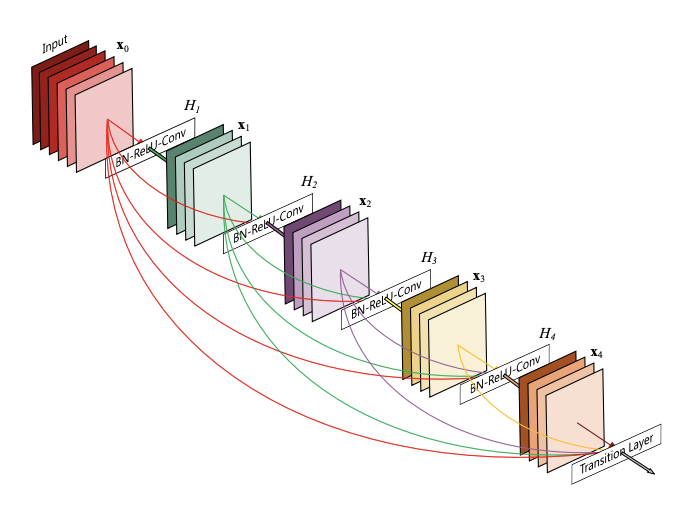


**DenseNet121** predstavlja prvi model nad kojim su trenirani podaci. DenseNet121 sadrži 121 sloj, pri čemu je na sam kraj dodat sloj koji sadrži broj klasa(37). DenseNet121 predstavlja posebnu vrstu konvolucijske neuronske mreže (CNN) koja ima slojeve koji su međusobno povezani, omogućavajući prolaz informacija iz jednog sloja u sve ostale slojev, koja se bazira na klasifikaciji ulaznih podataka.

Kako se broj slojeva u CNN-u povećava, odnosno kako oni postaju sve dublji, pojavljuje se problem 'nestajanja gradijenta'. To znači da kako se put za informacije od ulaznih do izlaznih slojeva povećava, to može dovesti do toga da određene informacije 'nestanu' ili se izgube, što smanjuje sposobnost mreže da se efikasno obučava.

DenseNets rešavaju ovaj problem modifikujući standardnu CNN arhitekturu i pojednostavljujući obrazac povezivanja između slojeva. U DenseNet arhitekturi, svaki sloj je direktno povezan sa svakim drugim slojem, pa otuda i naziv Gusto povezana konvoluciona mreža.

Ova arhitektura je trenirana na velikim skupovima podataka, kao što je ImageNet.

Za prosleđeni set podataka, DenseNet121 obezbeđuje najbolje rezultate.

Na slici je prikazana DenseNet121 struktura.


Na ćeliji ispod prikazano je definisanje i prilagođavanje neuronske mreže za klasifikaciju slika koristeći prethodno obučen, već pomenuti model Densenet121.

Uvozi se klasa DenseNet121 iz TensorFlow-ovog modula keras.applications.

Inicijalizuje se instanca modela DenseNet121. Ova instanca sadrži celu arhitekturu Densenet121 sa svim slojevima i težinama naučenim tokom prethodnog obučavanja na ImageNet skupu podataka.

Uzima se izlazni sloj (pretposlednji sloj) iz modela dense_net, a zatim se na taj sloj primenjuje Dropout sloj sa stopom 0.5. Dropout je tehnika regularizacije koja pomaže u sprečavanju preprilagođavanja tako što nasumično isključuje određeni broj neurona tokom svake iteracije obučavanja.

Broj klasa se određuje prebrojavanjem jedinstvenih vrednosti u koloni 'class_id' u DataFrame-u data_df.

Dodaje se potpuno povezani (Dense) sloj na osnovu prethodno obrađenog dense_net_layer. Ovaj sloj ima broj izlaznih neurona jednak broju klasa, a aktivaciona funkcija je softmax. Softmax funkcija se koristi za pretvaranje izlaza neuronske mreže u verovatnoće pripadnosti različitim klasama.

Kreira se novi model sa početkom ulaza definisanim originalnim ulazom modela dense_net, a izlaznim slojem koji je sada definisan kao last_layer.

Vrši se kompajliranje modela. Koristi se gubitak kategoričke unakrsne entropije za višeklasnu klasifikaciju. Adam optimizator se koristi za prilagođavanje modela sa stopom učenja od 0.0001. Metrika tačnosti će se pratiti tokom obučavanja kako bi se evaluirala performansa modela.

In [ ]:
from tensorflow.keras.applications import DenseNet121
dense_net = tf.keras.applications.DenseNet121()

dense_net_layer=Dropout(0.5)(dense_net.layers[-2].output)
number_of_classes = len(data_df['class_id'].unique())

last_layer = Dense(number_of_classes, activation="softmax")(dense_net_layer)
model = Model(dense_net.input, last_layer)

model.compile(loss='sparse_categorical_crossentropy',
              optimizer=Adam(0.0001),
              metrics=['accuracy'])


33188688/33188688 [==============================] - 3s 0us/step


ModelCheckpoint callback omogućava automatsko čuvanje modela tokom obučavanja na osnovu praćene metrike (val_accuracy u ovom slučaju).

In [ ]:
from tensorflow.keras.callbacks import ModelCheckpoint

checkpoint = ModelCheckpoint(filepath='model.h5', monitor="val_accuracy", save_best_only=True, verbose=1)

EarlyStopping callback omogućava da se automatski zaustavi obučavanje kada se primeti da model prestaje da se unapređuje na validacionom skupu, čime se sprečava preprilagođavanje i štedi vreme tokom obučavanja.

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping

early_stopping = EarlyStopping(monitor='val_accuracy', mode='max', patience=5,  restore_best_weights=True)

U ćeliji ispod pokreće se proces obučavanja modela koristeći podatke X_train_converted i y_train_converted kao trening skup, i podatke X_val_converted i y_val_converted kao validacioni skup. Ovde su korišćeni prethodno definisani checkpoint i early_stopping callback-ovi.

Broj epoha koje će se koristiti za obučavanje modela je 50. Epoha predstavlja prolazak kroz ceo trening skup. Međutim, zbog unapred pomenutog early_stopping izvršavanje se zaustavlja ranije.

shuffle=True - Ova postavka govori da se trening podaci promešaju pre svake epohe, što pomaže da se izbegne preprilagođavanje.

In [ ]:
hist=model.fit(
    X_train_converted,
    y_train_converted,
    epochs=50,
    validation_data=(X_val_converted, y_val_converted),
    shuffle=True,
    batch_size=10,
    callbacks=[checkpoint, early_stopping]
)

Epoch 1/50
30/30 [==============================] - ETA: 0s - loss: 4.3566 - accuracy: 0.0507
Epoch 1: val_accuracy improved from -inf to 0.14667, saving model to model.h5
30/30 [==============================] - 100s 434ms/step - loss: 4.3566 - accuracy: 0.0507 - val_loss: 3.3203 - val_accuracy: 0.1467
Epoch 2/50
30/30 [==============================] - ETA: 0s - loss: 2.4244 - accuracy: 0.3514
Epoch 2: val_accuracy improved from 0.14667 to 0.34667, saving model to model.h5
30/30 [==============================] - 6s 191ms/step - loss: 2.4244 - accuracy: 0.3514 - val_loss: 2.4316 - val_accuracy: 0.3467
Epoch 3/50
30/30 [==============================] - ETA: 0s - loss: 1.4913 - accuracy: 0.6689
Epoch 3: val_accuracy improved from 0.34667 to 0.61333, saving model to model.h5
30/30 [==============================] - 6s 195ms/step - loss: 1.4913 - accuracy: 0.6689 - val_loss: 1.8482 - val_accuracy: 0.6133
Epoch 4/50
30/30 [==============================] - ETA: 0s - loss: 0.7904 - accura

Iscrtavaju se grafikoni tačnosti i gubitka (loss) kako za trening skup, tako i za validacioni skup tokom svake epohe. Na ovaj način može se dobiti uvid u to kako se tačnost i gubitak razvijaju tokom obučavanja i da li model pokazuje znakove preprilagođavanja ili poboljšanja tokom vremena.

Može se uočiti da accuracy teži ka 1, što je dobro.

Model loss govori koliko je pogrešnih predikcija bilo.

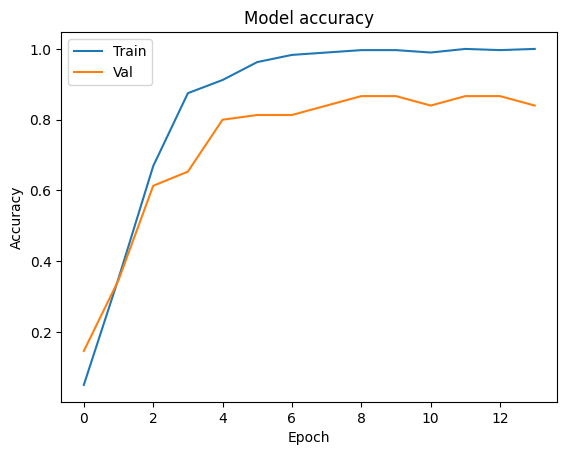

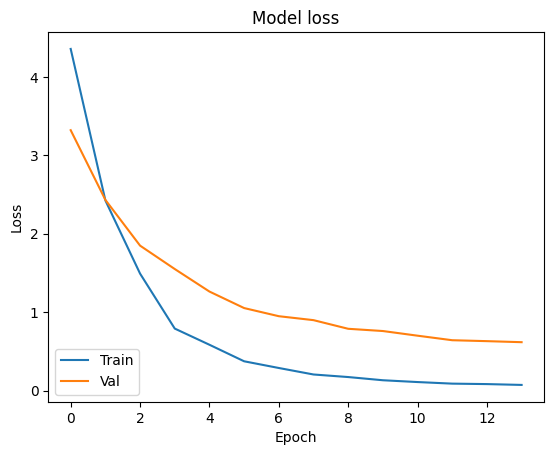

In [ ]:
plt.plot(hist.history['accuracy'])
plt.plot(hist.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper left')
plt.show()

plt.plot(hist.history['loss'])
plt.plot(hist.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='lower left')
plt.show()

U narednoj ćeliji učitan je model, na osnovu prethodno sačuvane lokacije.

In [ ]:
from tensorflow.keras import models as tf_models
# Load the best model (we create for checkpoint to save the best model)
model = tf_models.load_model('model.h5')

U nastavku dat je prikaz slika figurica, pri čemu iznad svake slike stoji predviđena vrednost klase kojoj pripada slika, dok se ispod slike nalazi stvarna vrednost klase kojoj pripada figurica.

1/1 [==============================] - 3s 3s/step
Class: 32 Minifigure: JANNAH


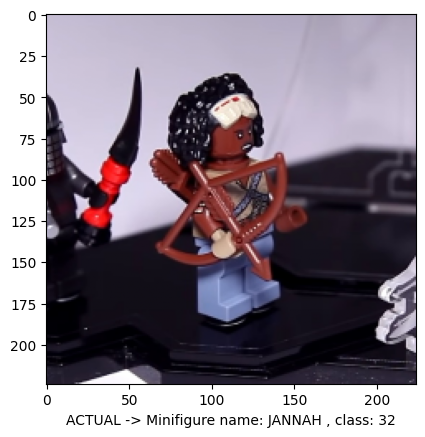

1/1 [==============================] - 0s 35ms/step
Class: 32 Minifigure: JANNAH


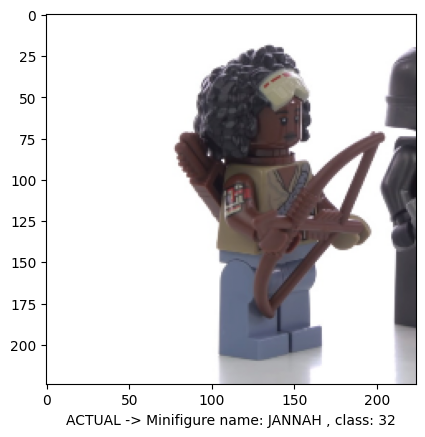

1/1 [==============================] - 0s 30ms/step
Class: 32 Minifigure: JANNAH


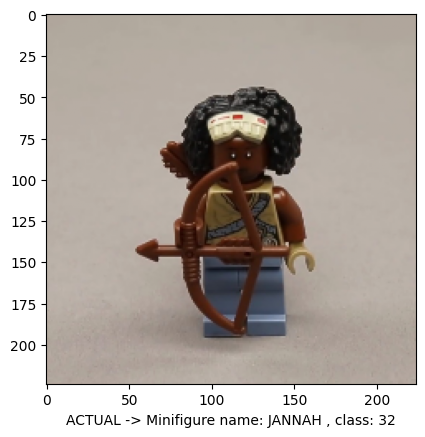

1/1 [==============================] - 0s 34ms/step
Class: 32 Minifigure: JANNAH


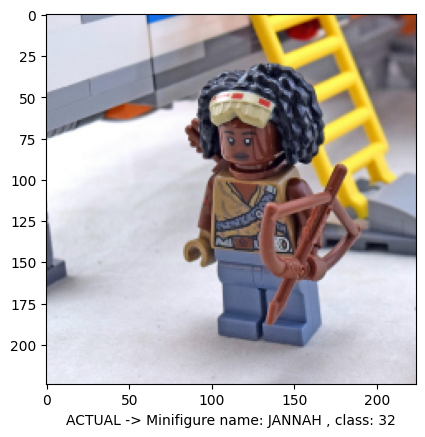

1/1 [==============================] - 0s 32ms/step
Class: 31 Minifigure: IRON MAN MK 50


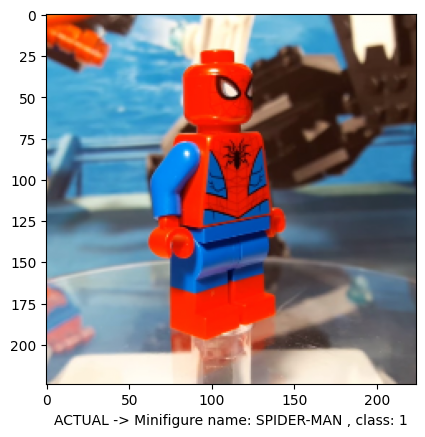

1/1 [==============================] - 0s 57ms/step
Class: 26 Minifigure: OWEN GRADY


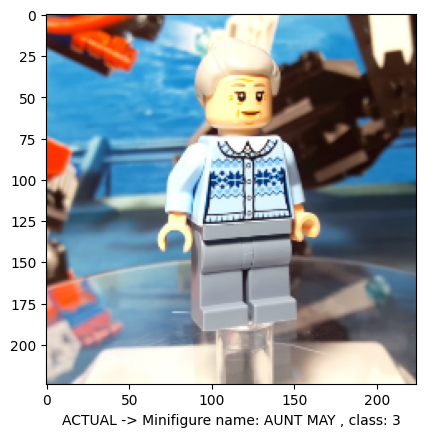

1/1 [==============================] - 0s 49ms/step
Class: 2 Minifigure: VENOM


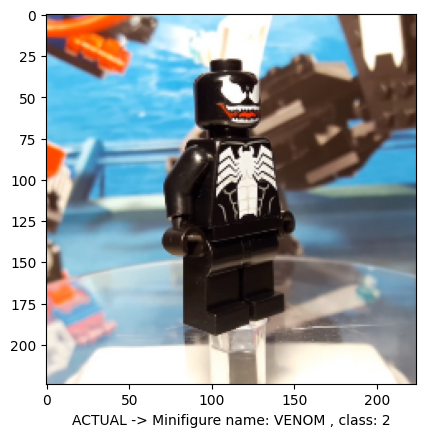

1/1 [==============================] - 0s 55ms/step
Class: 4 Minifigure: GHOST SPIDER


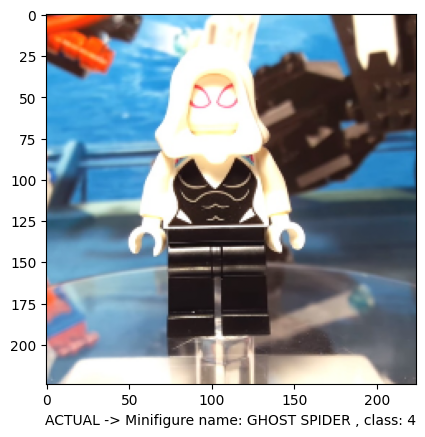

1/1 [==============================] - 0s 66ms/step
Class: 31 Minifigure: IRON MAN MK 50


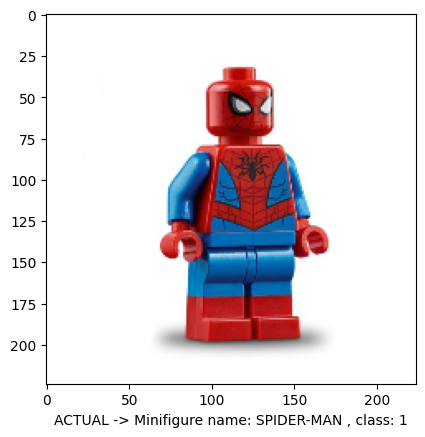

1/1 [==============================] - 0s 49ms/step
Class: 3 Minifigure: AUNT MAY


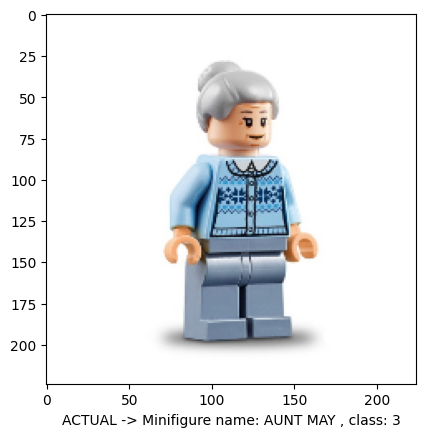

1/1 [==============================] - 0s 32ms/step
Class: 4 Minifigure: GHOST SPIDER


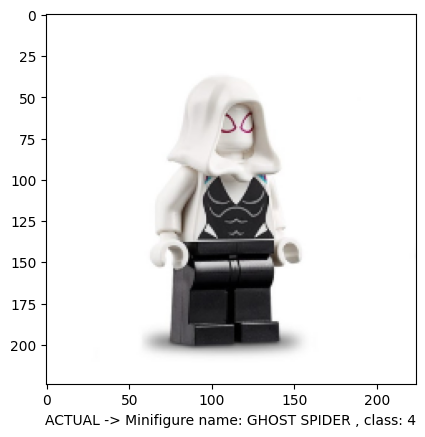

1/1 [==============================] - 0s 29ms/step
Class: 17 Minifigure: SPIDER-MAN


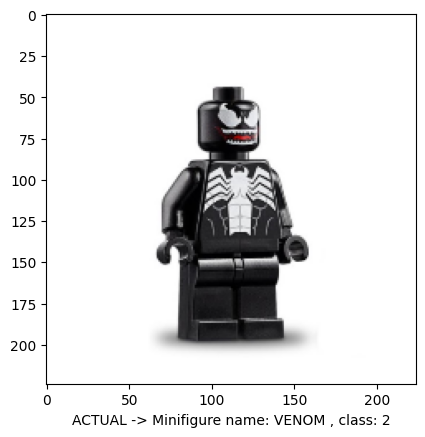

1/1 [==============================] - 0s 32ms/step
Class: 5 Minifigure: YODA


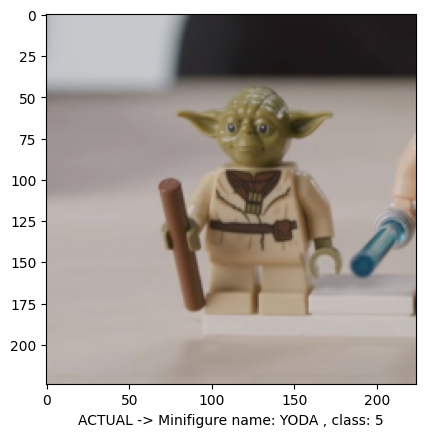

1/1 [==============================] - 0s 31ms/step
Class: 6 Minifigure: LUKE SKYWALKER


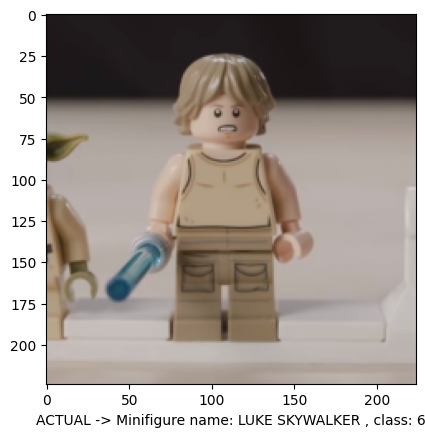

1/1 [==============================] - 0s 30ms/step
Class: 7 Minifigure: R2-D2


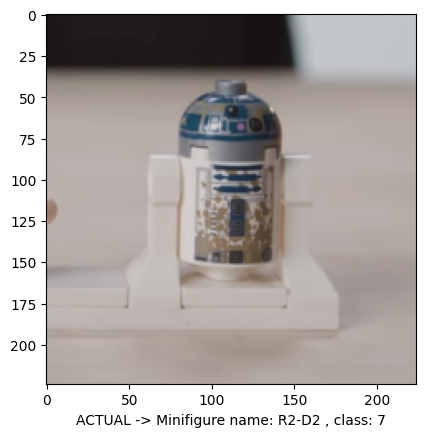

1/1 [==============================] - 0s 35ms/step
Class: 5 Minifigure: YODA


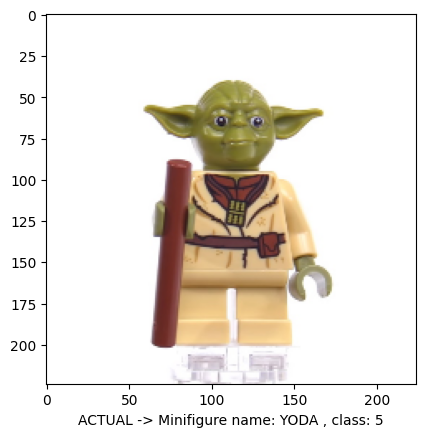

1/1 [==============================] - 0s 42ms/step
Class: 6 Minifigure: LUKE SKYWALKER


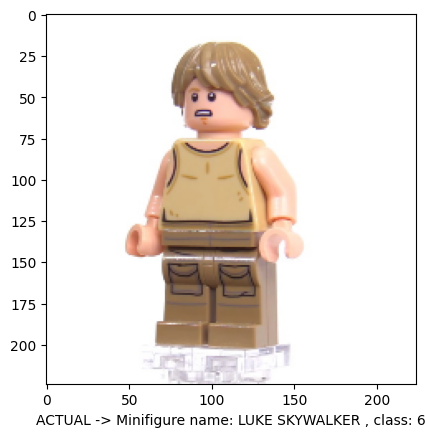

1/1 [==============================] - 0s 31ms/step
Class: 7 Minifigure: R2-D2


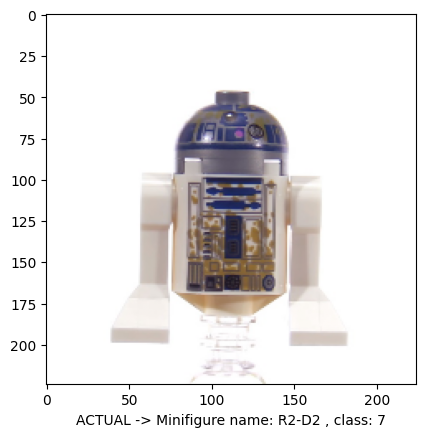

1/1 [==============================] - 0s 39ms/step
Class: 18 Minifigure: HARRY POTTER


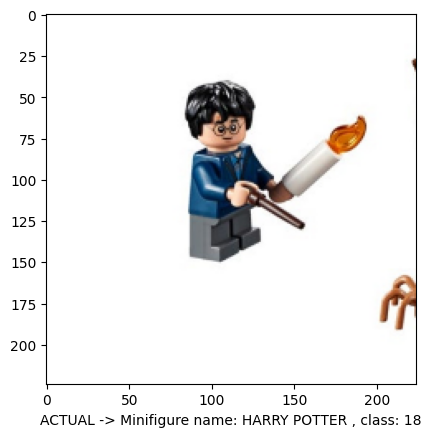

1/1 [==============================] - 0s 44ms/step
Class: 18 Minifigure: HARRY POTTER


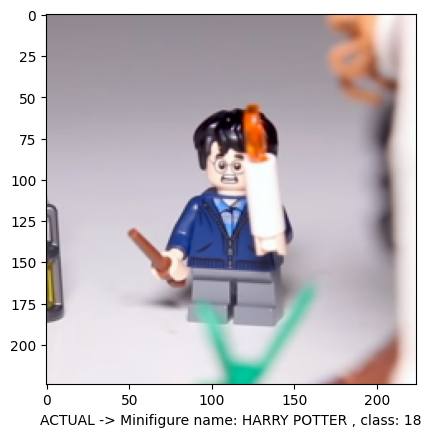

1/1 [==============================] - 0s 31ms/step
Class: 19 Minifigure: RON WEASLEY


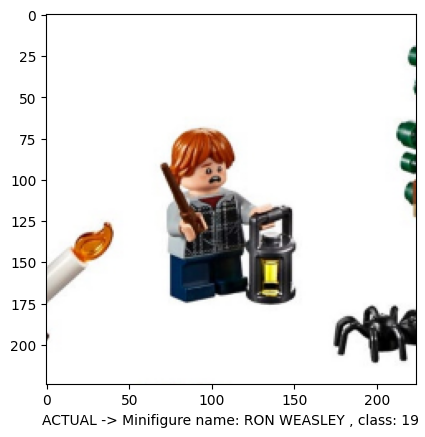

1/1 [==============================] - 0s 42ms/step
Class: 19 Minifigure: RON WEASLEY


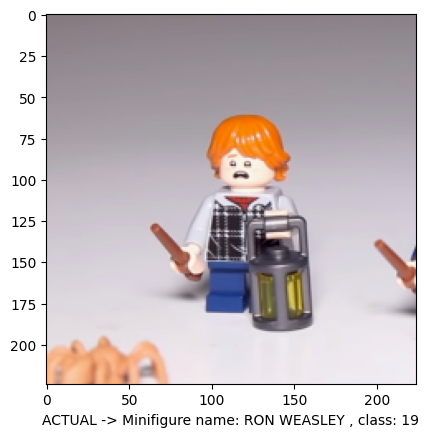

1/1 [==============================] - 0s 33ms/step
Class: 26 Minifigure: OWEN GRADY


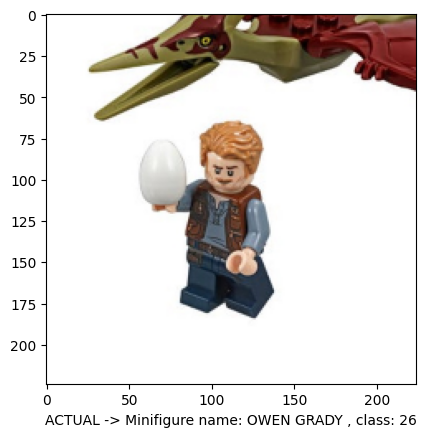

1/1 [==============================] - 0s 29ms/step
Class: 26 Minifigure: OWEN GRADY


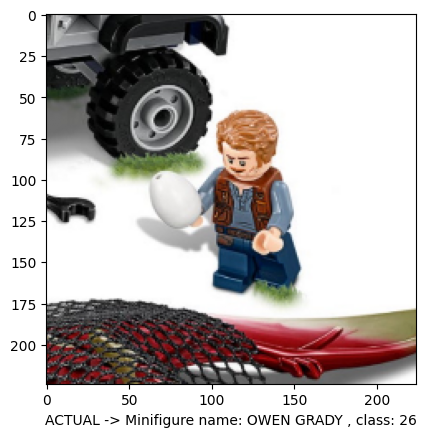

1/1 [==============================] - 0s 34ms/step
Class: 18 Minifigure: HARRY POTTER


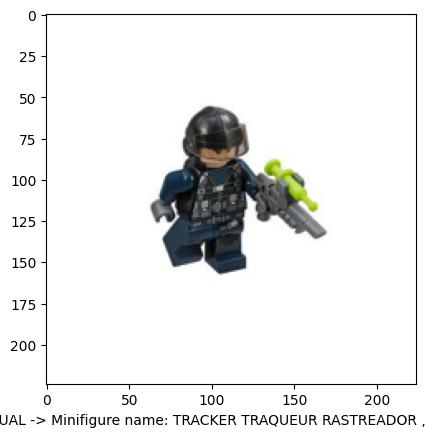

1/1 [==============================] - 0s 31ms/step
Class: 27 Minifigure: TRACKER TRAQUEUR RASTREADOR


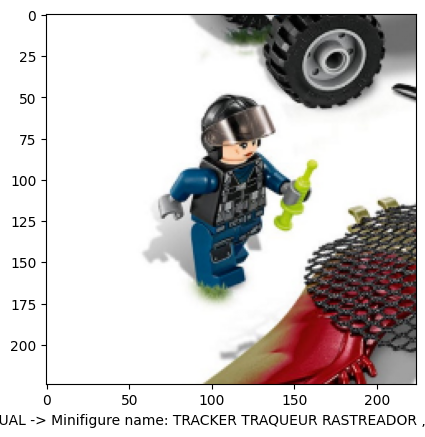

1/1 [==============================] - 0s 39ms/step
Class: 15 Minifigure: MYSTERIO


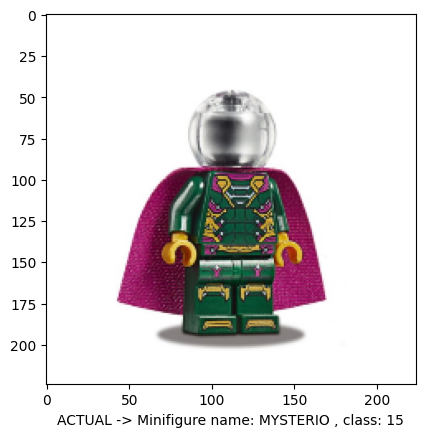

1/1 [==============================] - 0s 30ms/step
Class: 16 Minifigure: FIREFIGHTER


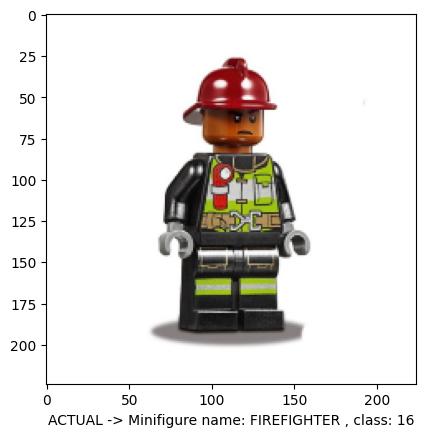

1/1 [==============================] - 0s 29ms/step
Class: 17 Minifigure: SPIDER-MAN


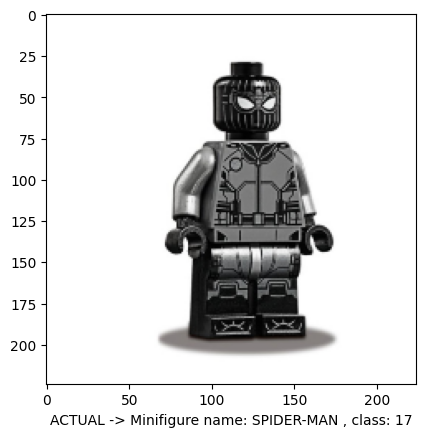

1/1 [==============================] - 0s 33ms/step
Class: 14 Minifigure: KLATOOINIAN RAIDER 2


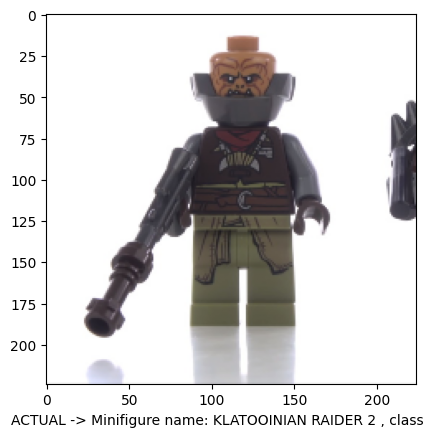

1/1 [==============================] - 0s 41ms/step
Class: 20 Minifigure: BLACK WIDOW


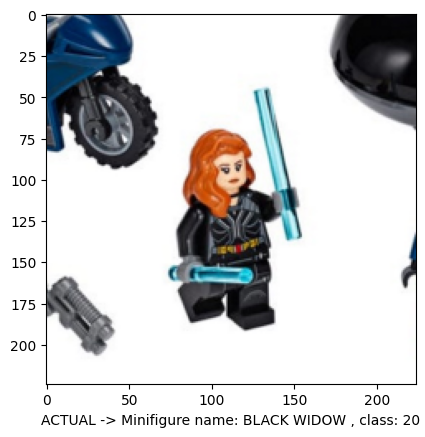

1/1 [==============================] - 0s 35ms/step
Class: 30 Minifigure: IRON MAN MK 41


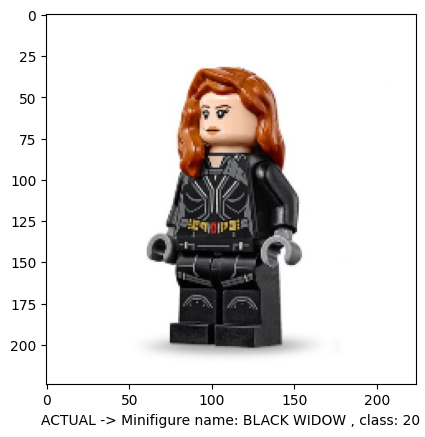

1/1 [==============================] - 0s 33ms/step
Class: 20 Minifigure: BLACK WIDOW


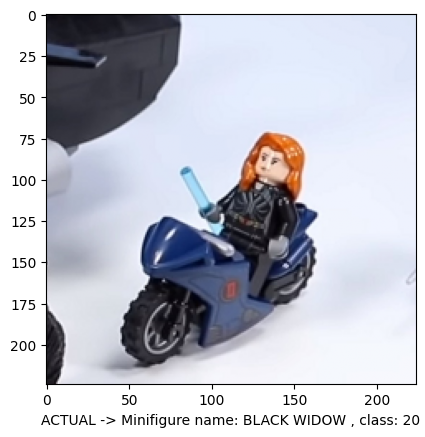

1/1 [==============================] - 0s 37ms/step
Class: 21 Minifigure: YELENA BELOVA


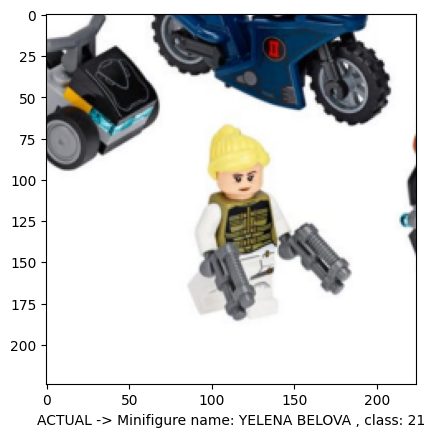

1/1 [==============================] - 0s 42ms/step
Class: 21 Minifigure: YELENA BELOVA


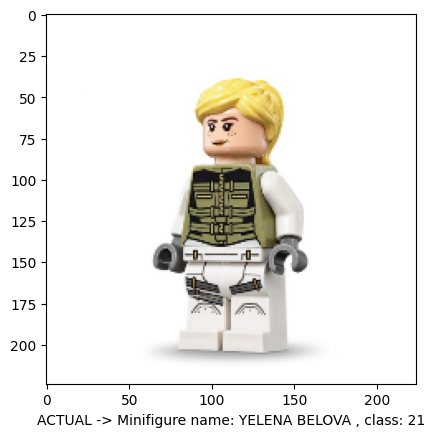

1/1 [==============================] - 0s 44ms/step
Class: 20 Minifigure: BLACK WIDOW


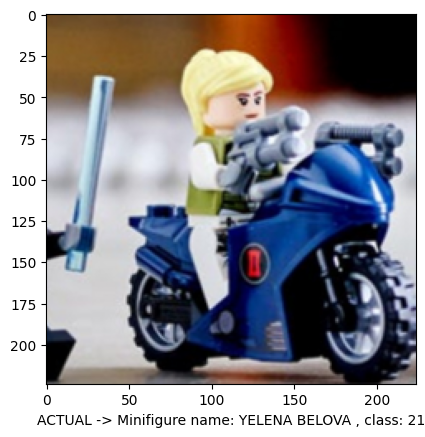

1/1 [==============================] - 0s 61ms/step
Class: 22 Minifigure: TASKMASTER


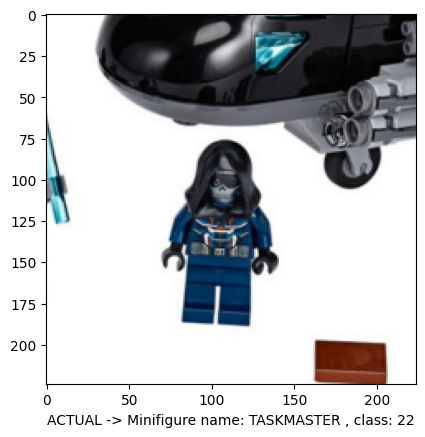

1/1 [==============================] - 0s 47ms/step
Class: 22 Minifigure: TASKMASTER


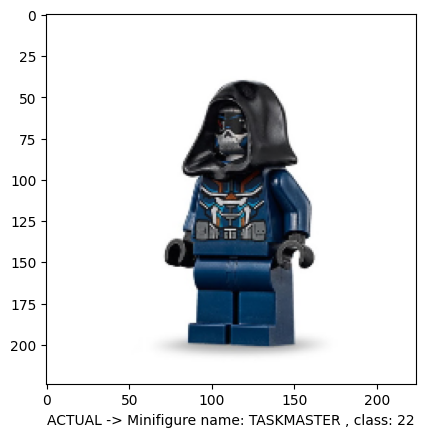

1/1 [==============================] - 0s 48ms/step
Class: 22 Minifigure: TASKMASTER


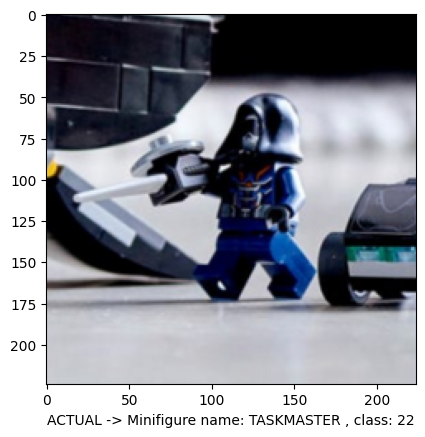

1/1 [==============================] - 0s 51ms/step
Class: 23 Minifigure: CAPTAIN AMERICA


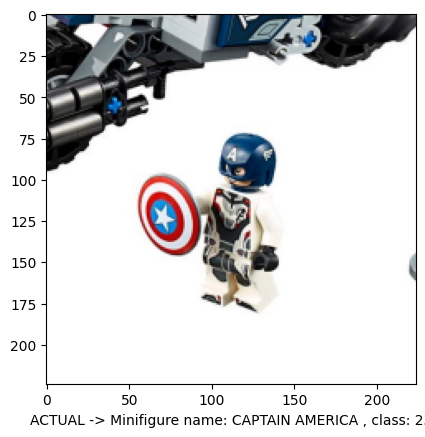

1/1 [==============================] - 0s 45ms/step
Class: 23 Minifigure: CAPTAIN AMERICA


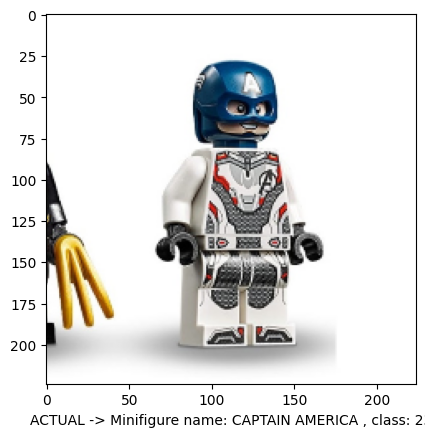

1/1 [==============================] - 0s 45ms/step
Class: 24 Minifigure: OUTRIDER 1


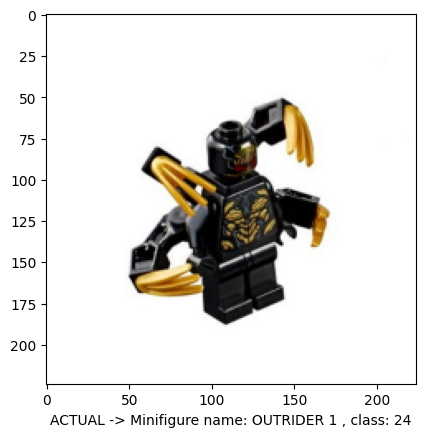

1/1 [==============================] - 0s 51ms/step
Class: 24 Minifigure: OUTRIDER 1


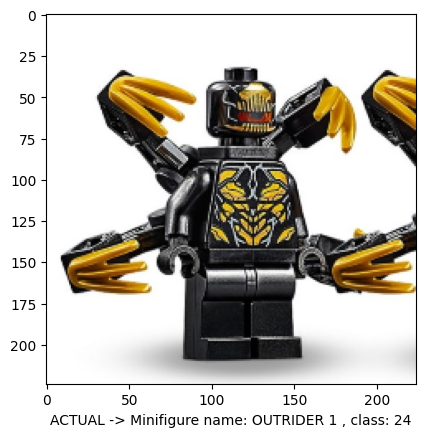

1/1 [==============================] - 0s 61ms/step
Class: 24 Minifigure: OUTRIDER 1


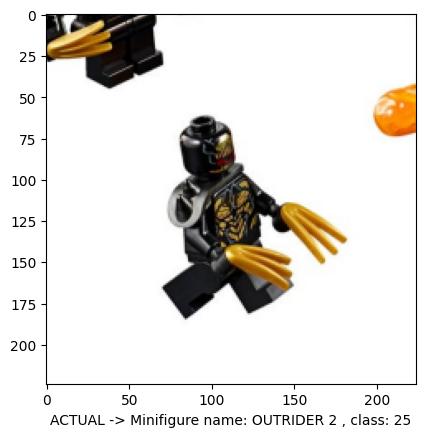

1/1 [==============================] - 0s 49ms/step
Class: 25 Minifigure: OUTRIDER 2


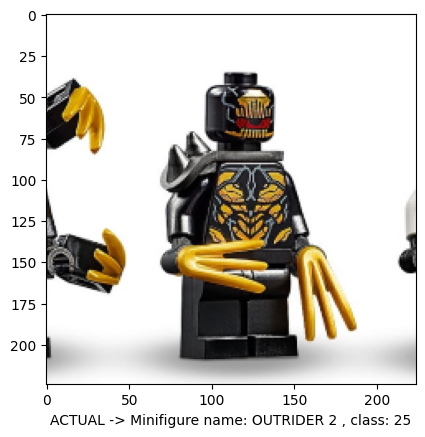

1/1 [==============================] - 0s 45ms/step
Class: 17 Minifigure: SPIDER-MAN


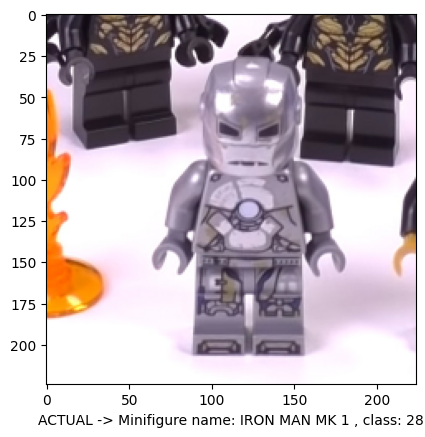

1/1 [==============================] - 0s 45ms/step
Class: 28 Minifigure: IRON MAN MK 1


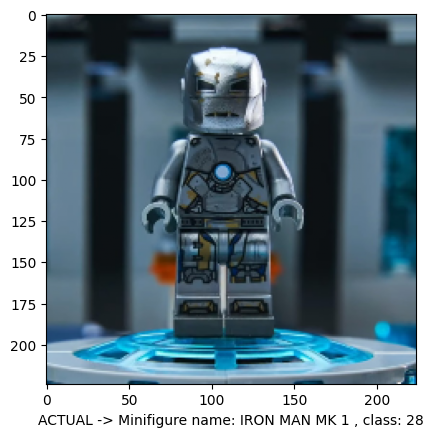

1/1 [==============================] - 0s 46ms/step
Class: 29 Minifigure: IRON MAN MK 5


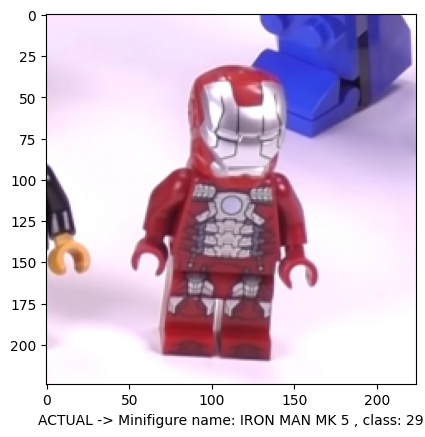

1/1 [==============================] - 0s 43ms/step
Class: 29 Minifigure: IRON MAN MK 5


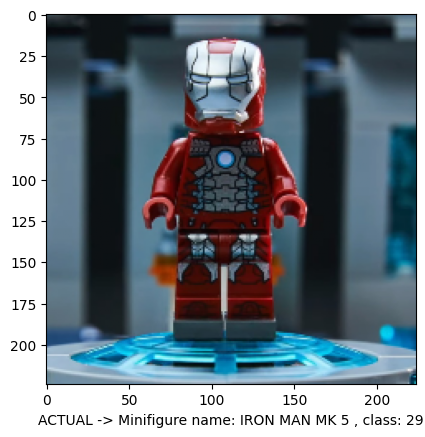

1/1 [==============================] - 0s 46ms/step
Class: 30 Minifigure: IRON MAN MK 41


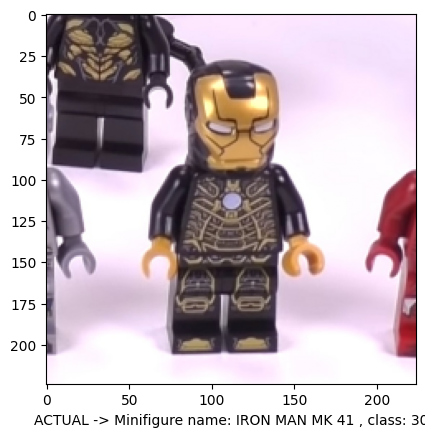

1/1 [==============================] - 0s 44ms/step
Class: 30 Minifigure: IRON MAN MK 41


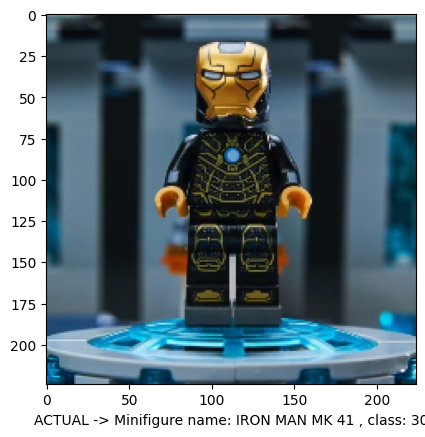

1/1 [==============================] - 0s 43ms/step
Class: 31 Minifigure: IRON MAN MK 50


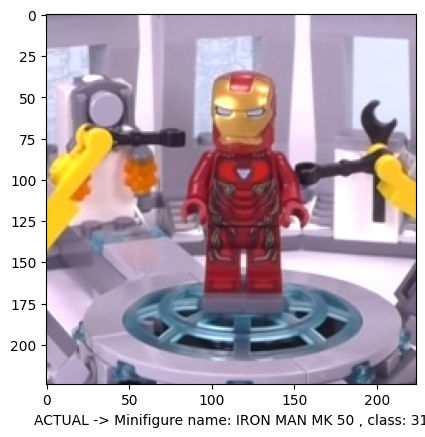

1/1 [==============================] - 0s 48ms/step
Class: 31 Minifigure: IRON MAN MK 50


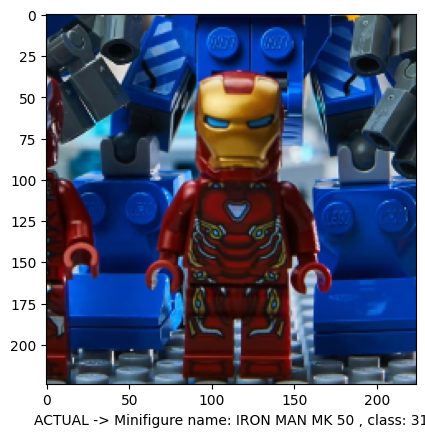

1/1 [==============================] - 0s 48ms/step
Class: 8 Minifigure: MACE WINDU


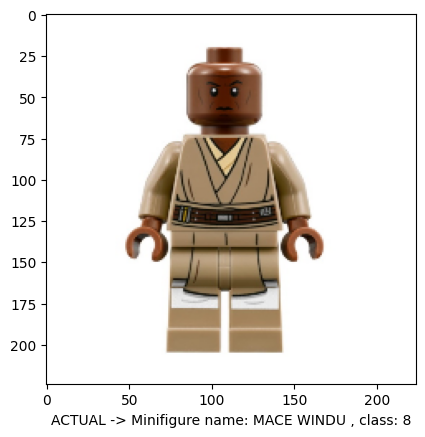

1/1 [==============================] - 0s 47ms/step
Class: 8 Minifigure: MACE WINDU


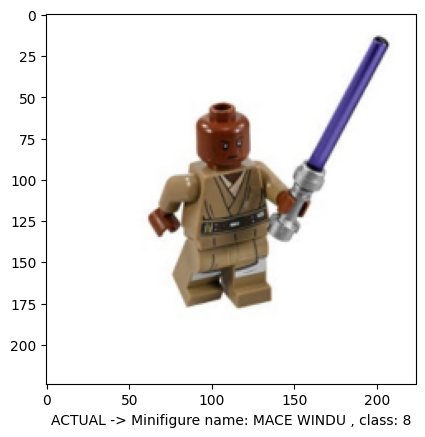

1/1 [==============================] - 0s 47ms/step
Class: 9 Minifigure: GENERAL GRIEVOUS


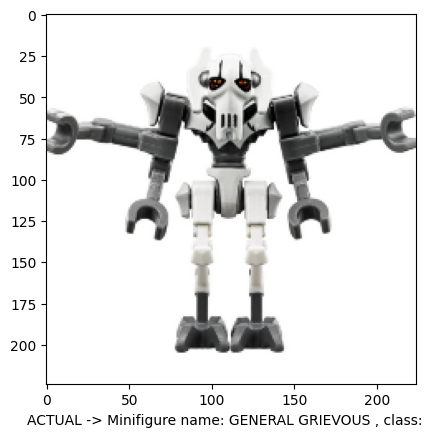

1/1 [==============================] - 0s 45ms/step
Class: 9 Minifigure: GENERAL GRIEVOUS


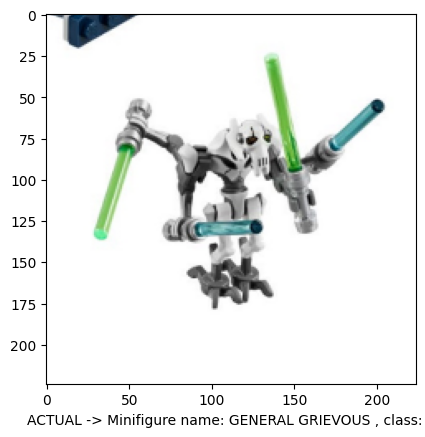

1/1 [==============================] - 0s 53ms/step
Class: 10 Minifigure: KYLO REN


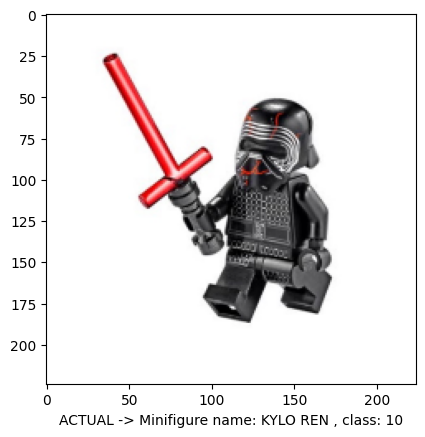

1/1 [==============================] - 0s 43ms/step
Class: 10 Minifigure: KYLO REN


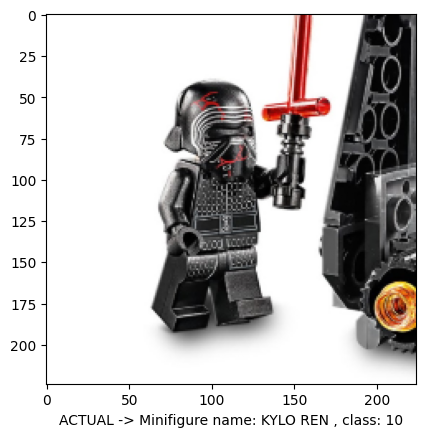

1/1 [==============================] - 0s 42ms/step
Class: 11 Minifigure: THE MANDALORIAN


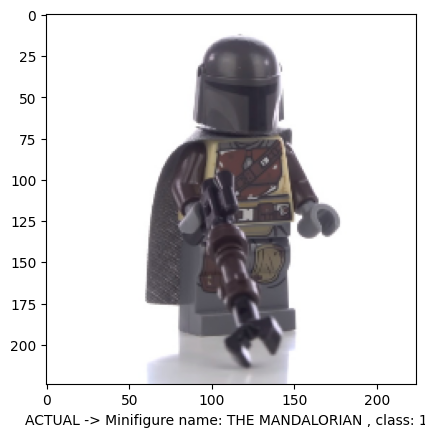

1/1 [==============================] - 0s 44ms/step
Class: 12 Minifigure: CARA DUNE


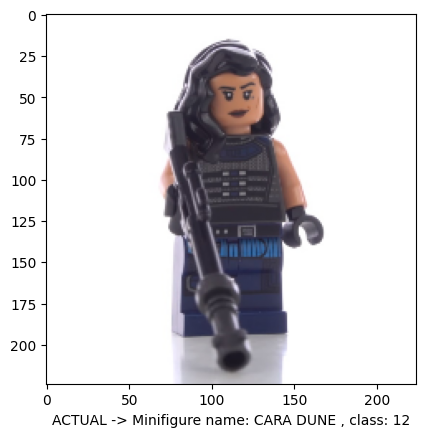

1/1 [==============================] - 0s 43ms/step
Class: 13 Minifigure: KLATOOINIAN RAIDER 1


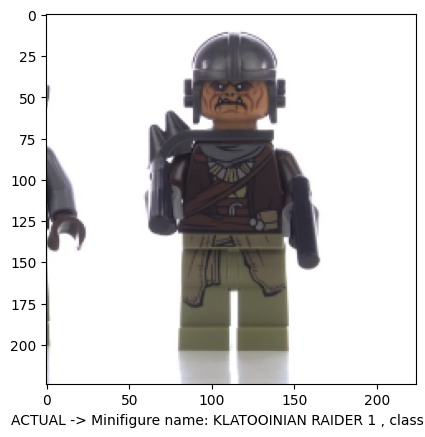

1/1 [==============================] - 0s 52ms/step
Class: 9 Minifigure: GENERAL GRIEVOUS


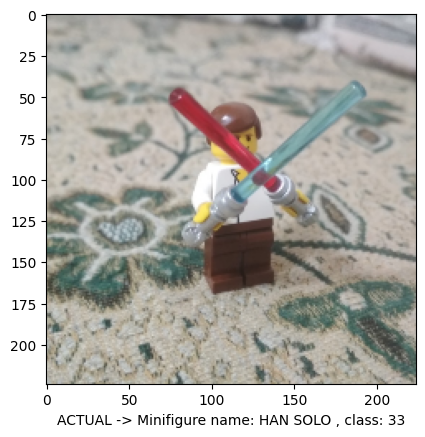

1/1 [==============================] - 0s 47ms/step
Class: 33 Minifigure: HAN SOLO


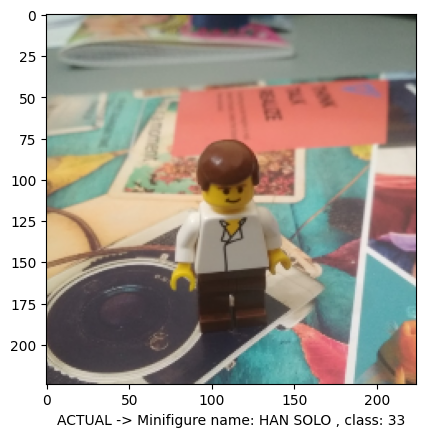

1/1 [==============================] - 0s 44ms/step
Class: 34 Minifigure: DARTH VADER


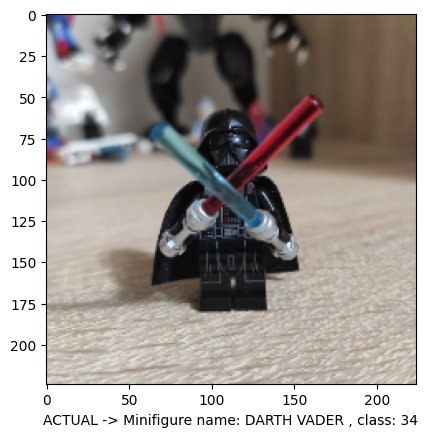

1/1 [==============================] - 0s 93ms/step
Class: 34 Minifigure: DARTH VADER


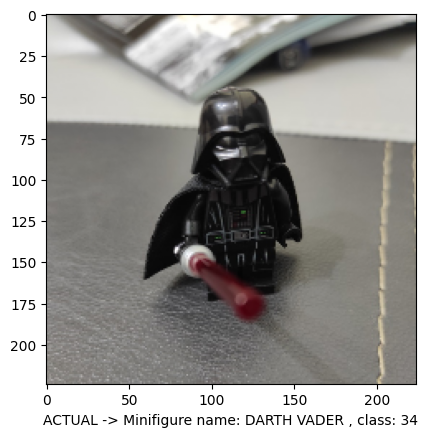

1/1 [==============================] - 0s 90ms/step
Class: 34 Minifigure: DARTH VADER


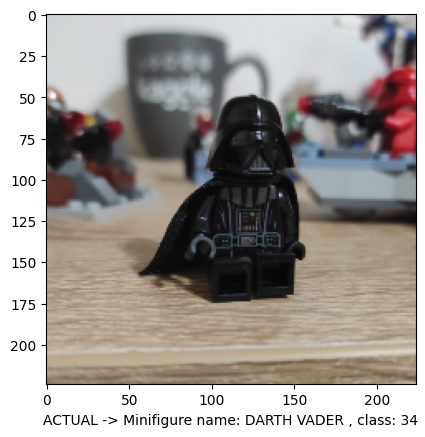

1/1 [==============================] - 0s 45ms/step
Class: 34 Minifigure: DARTH VADER


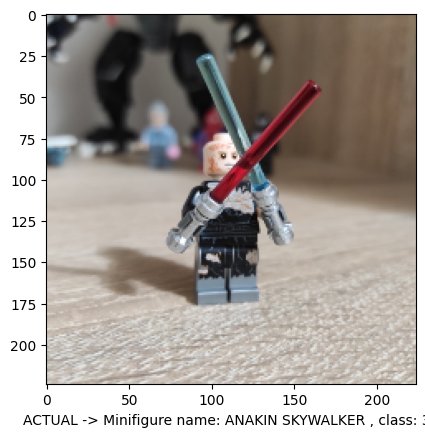

1/1 [==============================] - 0s 70ms/step
Class: 35 Minifigure: ANAKIN SKYWALKER


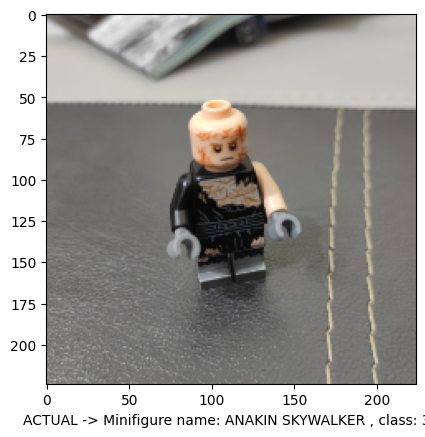

1/1 [==============================] - 0s 69ms/step
Class: 35 Minifigure: ANAKIN SKYWALKER


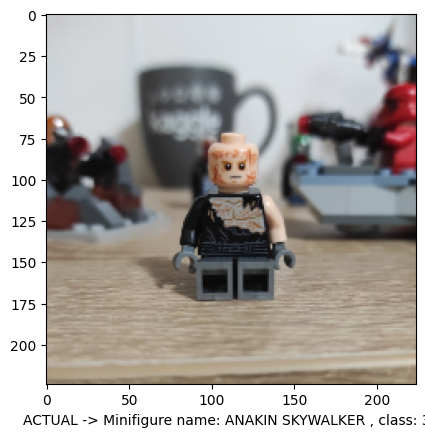

1/1 [==============================] - 0s 43ms/step
Class: 36 Minifigure: EMPEROR PALPATINE


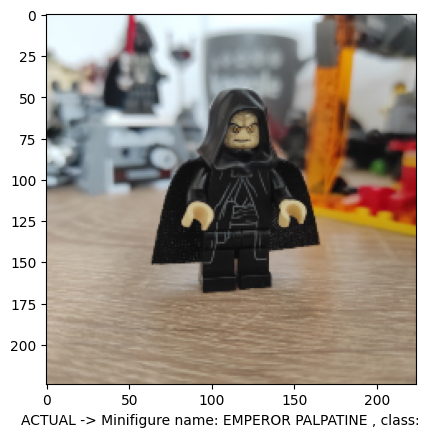

1/1 [==============================] - 0s 48ms/step
Class: 36 Minifigure: EMPEROR PALPATINE


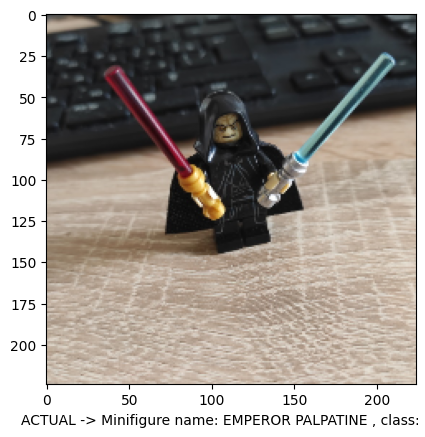

1/1 [==============================] - 0s 42ms/step
Class: 36 Minifigure: EMPEROR PALPATINE


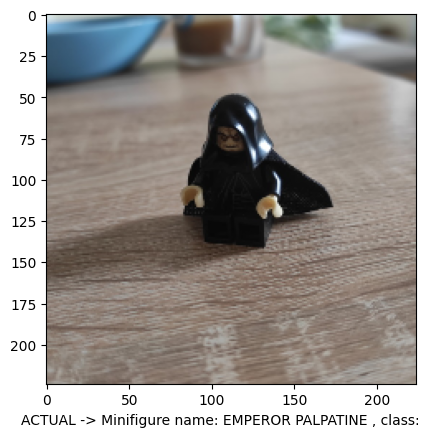

1/1 [==============================] - 0s 52ms/step
Class: 37 Minifigure: OBI-WAN KENOBI


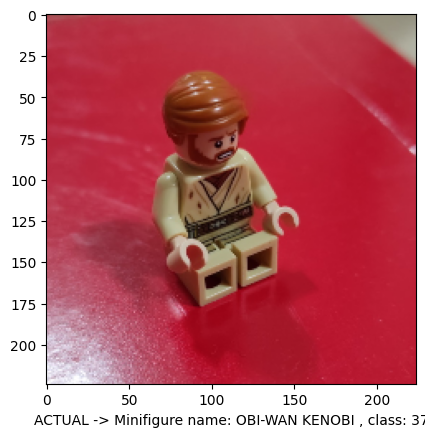

1/1 [==============================] - 0s 43ms/step
Class: 37 Minifigure: OBI-WAN KENOBI


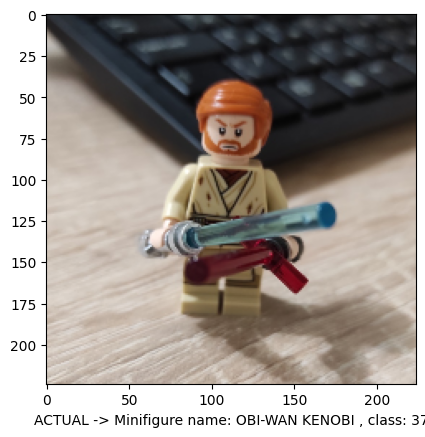

1/1 [==============================] - 0s 55ms/step
Class: 37 Minifigure: OBI-WAN KENOBI


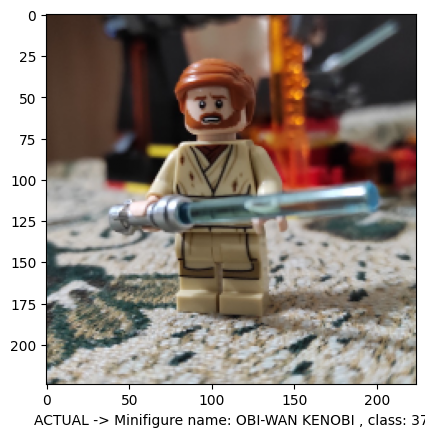

1/1 [==============================] - 0s 43ms/step
Class: 38 Minifigure: BOBA FETT


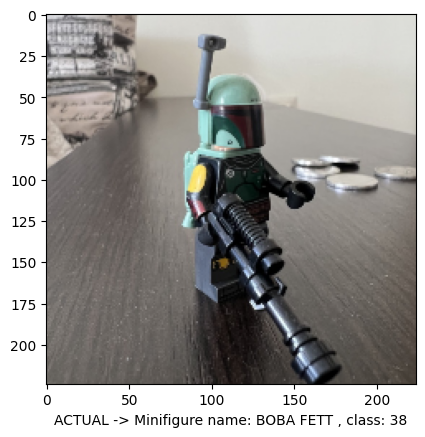

1/1 [==============================] - 0s 47ms/step
Class: 38 Minifigure: BOBA FETT


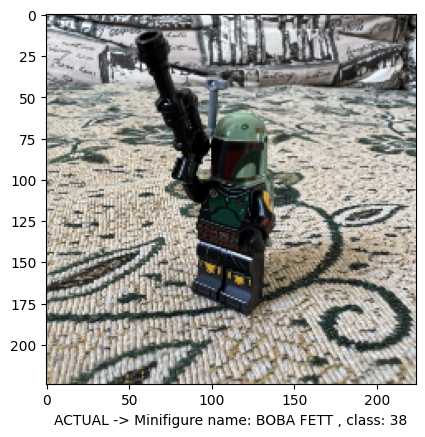

1/1 [==============================] - 0s 43ms/step
Class: 38 Minifigure: BOBA FETT


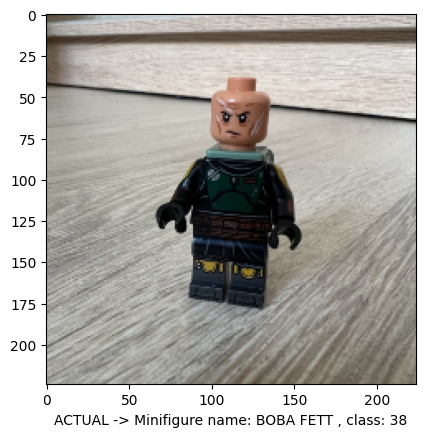

In [ ]:
for i in range(len(test_df)):

    image = cv2.imread(X_test['path'].values[i])
    image = cv2.resize(image, dsize=(224,224))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)/255
    plt.imshow(image)
    plt.xlabel('ACTUAL -> Minifigure name: ' + test_actual_df['minifigure_name'].values[i]+' , class: '+str(test_actual_df['class_id'].values[i]))
    image = np.reshape(image, (1, 224, 224, 3))
    ans = model.predict(image).argmax()
    ans = ans+1
    minifigure = metadata_df["minifigure_name"][metadata_df["class_id"] == ans].iloc[0]
    print("Class:", str(ans)+ " Minifigure:",minifigure)
    plt.show()

Ova ćelija izračunava i prikazuje gubitak (loss) i tačnost (accuracy) modela na validacionom skupu.

Vrednost gubitka validacionom skupu iznosi 0.7877819538116455. Gubitak je mera koliko su se stvarne vrednosti razlikovale od predviđenih vrednosti.

Manje vrednosti gubitka ukazuju na to da model tačno predviđa ciljne vrednosti, dok veće vrednosti ukazuju na veće razlike između stvarnih i predviđenih vrednosti.

Tačnost iznosi 0.8666666746139526 ili oko 86.67%. Tačnost je mera koliko su tačno predviđene klase u odnosu na ukupan broj primera.

Ova vrednost govori o procentu ispravnih predviđanja koje je model napravio.

Ovi rezultati ukazuju da je model dostigao pristojnu tačnost.

In [ ]:
loss, accuracy = model.evaluate(X_val_converted, y_val_converted, verbose=1)

print('Test loss:', loss)
print('Test accuracy:', accuracy)

3/3 [==============================] - 6s 836ms/step - loss: 0.7878 - accuracy: 0.8667
Test loss: 0.7877819538116455
Test accuracy: 0.8666666746139526


# **ResNet50**

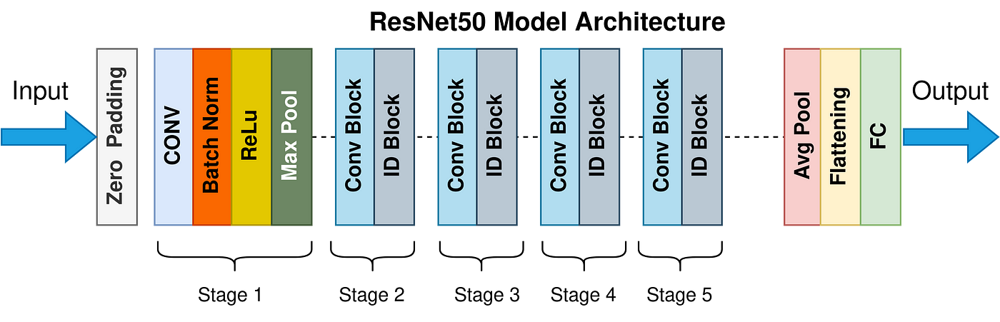

ResNet-50 je konvoluciona neuronska mreža duboka 50 slojeva (48 konvolucijskih slojeva, jedan sloj MaxPool i jedan sloj srednjeg poolinga). To je unapred obučenu verziju neuronske mreže obučenu na više od milion slika iz ImageNet baze podataka.

U ResNet-50 arhitekturi postoje dve vrste blokova:

1.  Identity Block
2.  Convolutional Block

Predstavlja jednu od najkvalitetnijih i najkorišćenijih unapred istreniranih neuronskih mreža.

Ćelija ispod definiše način na koji bi mogao da se uradi data augmentation na slikama. Ipak, kasnije kroz rad, augmentacija nije primenjena, ali je ovo primer kako bi to moglo da se uradi. Data augmentation je tehnika koja se koristi tokom treninga modela kako bi se veštački povećala raznolikost trening podataka, što može pomoći modelu da bolje generalizuje na novim podacima.

1.  **layers.experimental.preprocessing.RandomFlip('horizontal', input_shape=(224, 224, 3))**: Ova transformacija primenjuje horizontalni flip (preokretanje) na sliku sa određenom verovatnoćom.

2.  **layers.experimental.preprocessing.RandomRotation(0.1)**: Ova transformacija slučajno rotira sliku za najviše 0.1 radiana (oko 5.7 stepeni).

3.  **layers.experimental.preprocessing.RandomZoom(0.1)**: Ova transformacija slučajno primenjuje zumiranje slike za najviše 10%.

In [ ]:
data_augmentation = Sequential([
    layers.experimental.preprocessing.RandomFlip('horizontal',input_shape = (224,224,3)),
    layers.experimental.preprocessing.RandomRotation(0.1),
    layers.experimental.preprocessing.RandomZoom(0.1),
])

Postupak koji je urađen za DenseNet121, urađen je i kod ResNet50. Ovde je važno napomenuti da se istrenirani layeri, ne treniraju opet, te da se to može uočiti u okviru linije layer.trainable=False. Nakon izvršenja naredne ćelije, mogu se uočiti layeri, kao i broj njihovih parametara.

In [ ]:
model2 = Sequential()

pretrained_model= tf.keras.applications.ResNet50(include_top=False,
                   weights='imagenet',
                   input_shape=(224, 224, 3),
                   pooling='avg')

for layer in pretrained_model.layers:
        layer.trainable=False

#model2.add(data_augmentation)
model2.add(pretrained_model)
model2.add(tf.keras.layers.BatchNormalization())
model2.add(tf.keras.layers.Flatten())
model2.add(tf.keras.layers.Dense(512, activation='relu'))
model2.add(tf.keras.layers.Dense(number_of_classes, activation='softmax'))

model2.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50 (Functional)       (None, 2048)              23587712  
                                                                 
 batch_normalization_1 (Batc  (None, 2048)             8192      
 hNormalization)                                                 
                                                                 
 flatten_1 (Flatten)         (None, 2048)              0         
                                                                 
 dense_3 (Dense)             (None, 512)               1049088   
                                                                 
 dense_4 (Dense)             (None, 38)                19494     
                                                                 
Total params: 24,664,486
Trainable params: 1,072,678
Non-trainable params: 23,591,808
__________________________________

Kompajlira se model2, tj. postavljaju se osnovni parametri za obučavanje.
Koristi se gubitak kategoričke unakrsne entropije za višeklasnu klasifikaciju. Adam optimizator se koristi za prilagođavanje modela sa stopom učenja od 0.0001. Metrika tačnosti će se pratiti tokom obučavanja kako bi se evaluirala performansa modela.

In [ ]:
model2.compile(
    optimizer=Adam(0.0001),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

Ova ćelija definiše dva callback-a za praćenje i kontrolu procesa obučavanja modela.

**EarlyStopping** callback će zaustaviti obučavanje ako gubitak (loss) na validacionom skupu (val_loss) ne bude opadao tokom 5 uzastopnih epoha.

Definiše se i **ReduceLROnPlateau** callback, koji će dinamički prilagoditi stopu učenja (learning rate) tokom obučavanja.

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping

early_stopping = EarlyStopping(monitor='val_loss', mode='max', patience=5,  restore_best_weights=True)

learning_rate_reduction = tf.keras.callbacks.ReduceLROnPlateau( monitor = "accuracy", factor = 0.5, patience = 3, verbose = 0, min_lr = 0.0001 )
early_stopping = tf.keras.callbacks.EarlyStopping(patience=5, verbose=1)

Pokreće se proces obučavanja model2 koristeći podatke X_train_converted i y_train_converted kao trening skup, te podatke X_val_converted i y_val_converted kao validacioni skup. Takođe, koriste se definisani checkpoint, early_stopping i learning_rate_reduction callback-ovi.

U **hist** će biti sačuvana istorija obučavanja koja sadrži informacije o gubicima i metrikama tokom svake epohe.

In [ ]:
hist=model2.fit(X_train_converted, y_train_converted, validation_data=(X_val_converted, y_val_converted), batch_size = 10, epochs=100, callbacks=[checkpoint, early_stopping, learning_rate_reduction])

Epoch 1/100
30/30 [==============================] - ETA: 0s - loss: 3.6583 - accuracy: 0.0473
Epoch 1: val_accuracy did not improve from 0.86667
30/30 [==============================] - 9s 137ms/step - loss: 3.6583 - accuracy: 0.0473 - val_loss: 3.9378 - val_accuracy: 0.0267 - lr: 1.0000e-04
Epoch 2/100
29/30 [============================>.] - ETA: 0s - loss: 3.2777 - accuracy: 0.1448
Epoch 2: val_accuracy did not improve from 0.86667
30/30 [==============================] - 1s 49ms/step - loss: 3.2786 - accuracy: 0.1453 - val_loss: 3.8229 - val_accuracy: 0.0267 - lr: 1.0000e-04
Epoch 3/100
30/30 [==============================] - ETA: 0s - loss: 3.0708 - accuracy: 0.1791
Epoch 3: val_accuracy did not improve from 0.86667
30/30 [==============================] - 2s 52ms/step - loss: 3.0708 - accuracy: 0.1791 - val_loss: 3.7380 - val_accuracy: 0.0267 - lr: 1.0000e-04
Epoch 4/100
29/30 [============================>.] - ETA: 0s - loss: 2.8844 - accuracy: 0.2483
Epoch 4: val_accuracy did

Iscrtavaju se grafikoni tačnosti i gubitka (loss) kako za trening skup, tako i za validacioni skup tokom svake epohe. Na ovaj način može se dobiti uvid u to kako se tačnost i gubitak razvijaju tokom obučavanja i da li model pokazuje znakove preprilagođavanja ili poboljšanja tokom vremena.

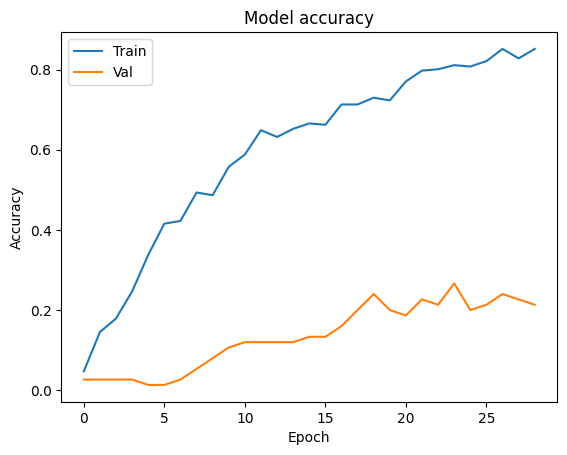

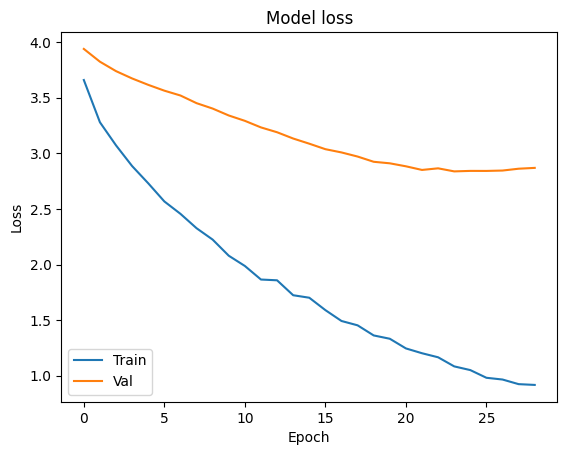

In [ ]:
plt.plot(hist.history['accuracy'])
plt.plot(hist.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper left')
plt.show()

plt.plot(hist.history['loss'])
plt.plot(hist.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='lower left')
plt.show()

Nakon dobijenih vrednosti tačnosti i gubitka možemo zaključiti sledeće:

*  Vrednost gubitka na validacionom skupu iznosi 2.86852765083313. Više vrednosti gubitka ukazuju na veće razlike između stvarnih i predviđenih vrednosti.

*  Tačnost iznosi 0.2133333384990692 ili oko 21.33%. Ovo znači da je samo oko 21.33% primera tačno klasifikovano.

Ovi rezultati ukazuju na to da model trenutno ima nisku tačnost i visok gubitak.

In [ ]:
loss, accuracy = model2.evaluate(X_val_converted, y_val_converted, verbose=1)

print('Test loss:', loss)
print('Test accuracy:', accuracy)

3/3 [==============================] - 2s 376ms/step - loss: 2.8685 - accuracy: 0.2133
Test loss: 2.86852765083313
Test accuracy: 0.2133333384990692


# **MobileNetV2**

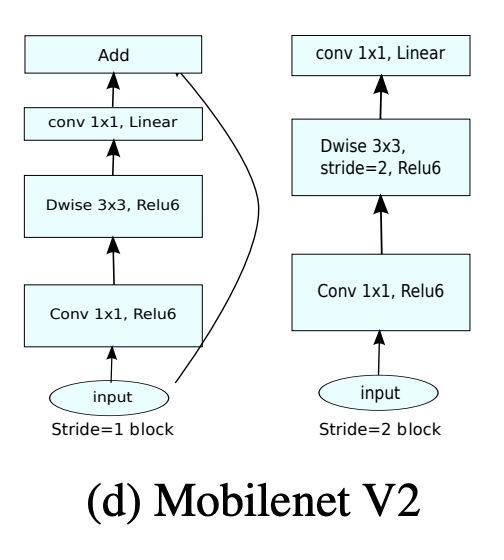

**MobileNetV2** je konvoluciona arhitektura neuronske mreže koja nastoji da dobro funkcioniše na mobilnim uređajima. Zasnovan je na obrnutoj rezidualnoj strukturi gde su preostale veze između slojeva uskih grla. Sloj srednjeg proširenja koristi lagane dubinske konvolucije da filtrira karakteristike kao izvor nelinearnosti. U celini, arhitektura MobileNetV2 sadrži početni sloj sa potpuno konvolucijom sa 32 filtera, praćen sa 19 preostalih slojeva uskog grla.

U ovoj ćeliji definiše se novi model, model3, koristeći prethodno obučeni MobileNetV2 kao osnovu, a zatim se dodaju slojevi na vrhu kako bi se prilagodio zadatku klasifikacije.

Koristi se dropout sa verovatnoćom 0.5 na izlazu pretposlednjeg sloja MobileNetV2 modela.

Dodaje se potpuno povezan sloj (Dense) na izlazu iz dropout sloja. Broj neurona u ovom sloju je jednak broju klasa u problemu klasifikacije, a aktivaciona funkcija je softmax.

Ovde se postavlja da slojevi MobileNetV2 modela budu neobučavajući. To znači da će težine ovih slojeva ostati nepromenjene tokom daljeg obučavanja.

Model se kreira i kompajlira.

In [ ]:
# We take pretrained MobileNetV2 (see Keras docs)
base_model = tf_mobilenet_v2.MobileNetV2()
# Take penultimate layer of the MobileNetV2 model and connect this layer with Dropout
x = layers.Dropout(.5)(base_model.layers[-2].output)
# Add additional Dense layer, with number of neurons as number of our classes
# Use softmax activation because we have one class classification problem
outputs = layers.Dense(number_of_classes, activation='softmax')(x)

base_model.trainable = False
# Create model using MobileNetV2 input and our created output
model3 = Model(base_model.inputs, outputs)



# Compile model using Adam optimizer and categorical crossentropy loss
model3.compile(
    optimizer=Adam(0.0001),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

model3.summary()

14536120/14536120 [==============================] - 2s 0us/step
Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 112, 112, 32  864         ['input_4[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 112, 112, 32  128         ['Conv1[0][0]']                  
                           

Definišu se dva callback-a.

**ModelCheckpoint** callback će pratiti tačnost na validacionom skupu (val_accuracy) i sačuvati model sa najboljom tačnošću tokom obučavanja.

**EarlyStopping** callback će zaustaviti obučavanje ako gubitak (loss) na validacionom skupu (val_loss) ne bude opadao tokom 5 uzastopnih epoha.

In [ ]:
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.callbacks import EarlyStopping

checkpoint = ModelCheckpoint(filepath='model.h5', monitor="val_accuracy", save_best_only=True, verbose=1)

early_stopping = EarlyStopping(monitor='val_loss', mode='max', patience=5,  restore_best_weights=True)

Kao i do sad, pokreće se proces obučavanja model3 koristeći definisane trening i validacione podatke, uz podršku ModelCheckpoint callback-a.

In [ ]:
hist=model3.fit(X_train_converted, y_train_converted, validation_data=(X_val_converted, y_val_converted), batch_size = 10, epochs=100, callbacks=[checkpoint])

Epoch 1/100
30/30 [==============================] - ETA: 0s - loss: 4.3937 - accuracy: 0.0372
Epoch 1: val_accuracy improved from -inf to 0.05333, saving model to model.h5
30/30 [==============================] - 7s 108ms/step - loss: 4.3937 - accuracy: 0.0372 - val_loss: 3.9666 - val_accuracy: 0.0533
Epoch 2/100
29/30 [============================>.] - ETA: 0s - loss: 4.2379 - accuracy: 0.0448
Epoch 2: val_accuracy did not improve from 0.05333
30/30 [==============================] - 1s 23ms/step - loss: 4.2236 - accuracy: 0.0473 - val_loss: 3.8049 - val_accuracy: 0.0533
Epoch 3/100
27/30 [==========================>...] - ETA: 0s - loss: 4.0026 - accuracy: 0.0519
Epoch 3: val_accuracy improved from 0.05333 to 0.08000, saving model to model.h5
30/30 [==============================] - 1s 31ms/step - loss: 3.9596 - accuracy: 0.0608 - val_loss: 3.6876 - val_accuracy: 0.0800
Epoch 4/100
27/30 [==========================>...] - ETA: 0s - loss: 3.8792 - accuracy: 0.0519
Epoch 4: val_accura

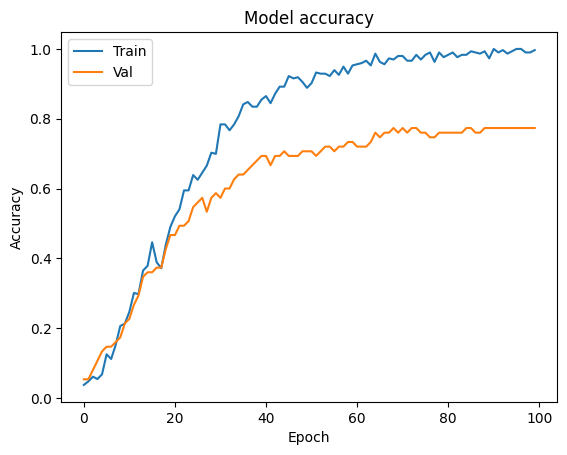

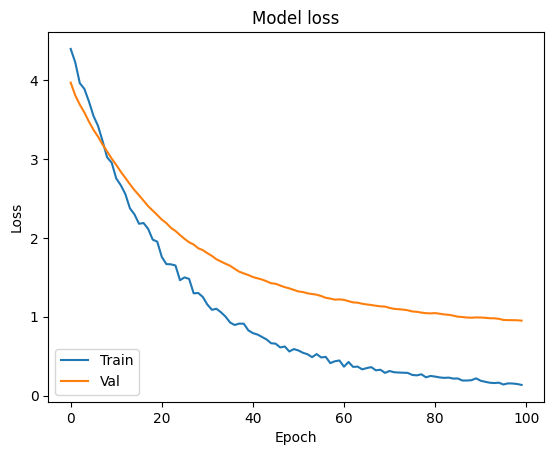

In [ ]:
plt.plot(hist.history['accuracy'])
plt.plot(hist.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper left')
plt.show()

plt.plot(hist.history['loss'])
plt.plot(hist.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='lower left')
plt.show()

Rezultati evaluacije modela model3 su:

Vrednost gubitka na validacionom skupu iznosi 0.9507945775985718. Niža vrednost gubitka ukazuje na manje razlike između stvarnih i predviđenih vrednosti.

Tačnost iznosi 0.7733333110809326 ili oko 77.33%. Ovo znači da je oko 77.33% primera tačno klasifikovano.

Ovi rezultati ukazuju na to da je model3 postigao značajno bolje performanse u poređenju sa prethodnim modelom, ali malo lošije nego prvi model.

Postizanje tačnosti od 77.33% može se smatrati solidnim rezultatom, ali i dalje je moguće dalje poboljšanje.

In [ ]:
loss, accuracy = model3.evaluate(X_val_converted, y_val_converted, verbose=1)

print('Test loss:', loss)
print('Test accuracy:', accuracy)

3/3 [==============================] - 1s 246ms/step - loss: 0.9508 - accuracy: 0.7733
Test loss: 0.9507945775985718
Test accuracy: 0.7733333110809326


# **Zaključak**

Kao što je već viđeno, u ovom radu su pređeni svi koraci od učitavanja podataka, preko njihove obrade, do kreiranja i treniranja modela, da bi se na kraju ti modeli testirali i evaluirali. Ono što bi još više poboljšalo rezultate ovih modela bilo bi povećavanje broja ulaznih podataka čime bi i treniranje modela takođe bilo kvalitetnije, kao i povećanje broja epoha. Pored toga u poboljšanju rezultata doprinela bi i augmentacija ulaznih slika.

Na osnovu treniranja tri modela: DenseNet121, ResNet50 i MobileNetV2, može se zaključiti da su se rezultati dobijeni treningom DenseNet121 pokazali kao najbolji. Zatim nakon njega, isto zadovoljavajuće rezultate ima i MobileNetV2, za razliku od ResNet50 koji baš i nema toliko dobre rezultate i morali bi da se preduzmu neki od pomenutih koraka za poboljšanje.

Model DenseNet121 uspešno vrši predikciju i dodeljuje nazive figura, odnosno klase na osnovu slika iz testnog skupa. Takođe, same vrednosti koje se odnose na tačnost predikcije i gubitak su na zadovoljavajućem nivou, gde tačnost koja se odnosi na validacioni skup prelazi 0.8. Nakon njega tu je i MobileNetV2 model čija tačnost prelazi 0.7.

Vodeći se rezultatima dobijenim u okviru ovog rada, vidimo da se najbolji rezultati dobiju kada se koristi DenseNet121 mreža, uzimajući u obzir početni set podataka, kao i vrednosti ostalih parametara koji su određeni u toku rada.

Rad na ovom projektu je bio interesantan i izazovan. Bila sam u potrazi za što boljim rezultatima, menjajući vrednosti različitih parametara. Ovi rezultati do kojih sam na kraju došla su bili najbolja opcija s obzirom na ponuđene podatke i dostupne resurse.

# **Reference**

1.  https://link.springer.com/article/10.1007/s42979-021-00782-7
2.  https://paperswithcode.com/method/mobilenetv2
3.  https://www.mathworks.com/help/deeplearning/ref/resnet50.html#:~:text=ResNet%2D50%20is%20a%20convolutional,%2C%20pencil%2C%20and%20many%20animals.
4. https://iq.opengenus.org/resnet50-architecture/?fbclid=IwAR2Y63XDr0N5NmnLu-jwVKiiLDzJY3eit3gVD3QQCHR5Pe3_dsL2lJl2KHw
5. https://iq.opengenus.org/architecture-of-densenet121/?fbclid=IwAR1T8Wt6edFvKpRD6g0hErm8WEevHAzv4XQzocWr5tZEqnJMlWKz0oS1ZPA
6. https://www.tensorflow.org/
7. https://keras.io/api/callbacks/early_stopping/